# SC1015 Mini Project
## PT1 Team 4
- Chen Yanjin
- Crystal Lee Chau
- Eva Faith Wong Jie Ting

# 1. Problem Formulation:
###  Problem Definition:
Analyze the customer behaviour and purchase patterns on the Brazilian E-commerce website to provide insights to improve the sales and marketing strategy.
<br>
### Dataset:
https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce
<br>
### Context
The following information pertains to a dataset provided by Olist, a major department store in Brazilian marketplaces. Olist streamlines the process for small businesses across Brazil to sell their products through the Olist Store and utilize Olist's logistics partners for direct shipping to customers, all through a single contract. When a customer makes a purchase from Olist Store, the corresponding seller is notified to fulfill the order. Following delivery or the estimated delivery date, the customer receives a satisfaction survey via email to rate their purchasing experience and provide feedback.
<hr>

# 2. Data Preparation and Cleaning:
## Importing Libraries

In [1]:
# Import libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
# ! pip install mlxtend
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

## Data Schema


The data is divided into multiple datasets for better understanding and organizing. 

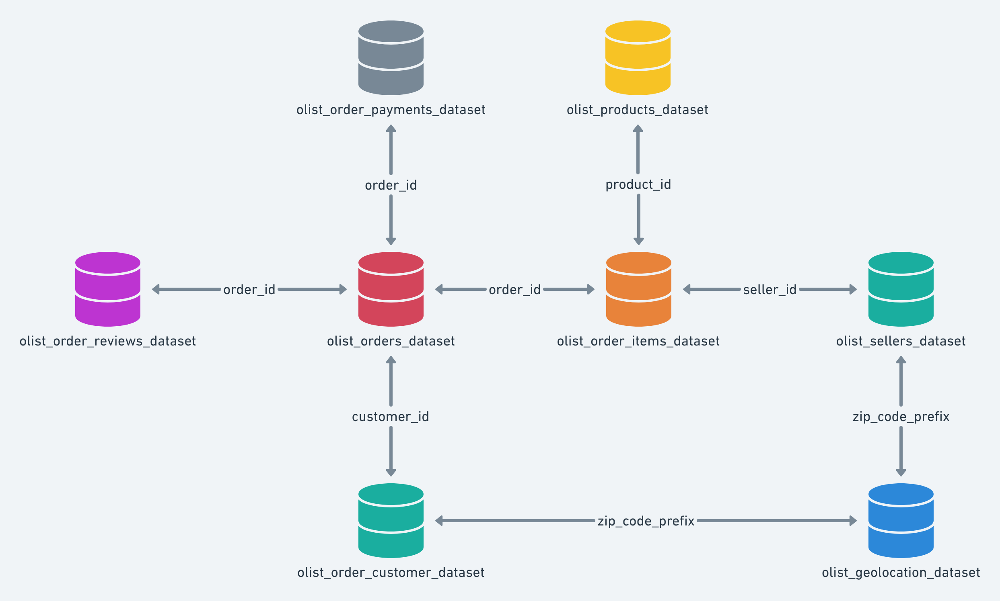

In [2]:
from IPython.display import Image
Image(filename="Images/olist.png", width=600, height=300)

## Reading Data from CSV Files

In [3]:
# Load the data from CSV files
orders = pd.read_csv('Datasets/olist_orders_dataset.csv')
order_items = pd.read_csv('Datasets/olist_order_items_dataset.csv')
customers = pd.read_csv('Datasets/olist_customers_dataset.csv')
products = pd.read_csv('Datasets/olist_products_dataset.csv')
sellers = pd.read_csv('Datasets/olist_sellers_dataset.csv')
payments = pd.read_csv('Datasets/olist_order_payments_dataset.csv')
reviews = pd.read_csv('Datasets/olist_order_reviews_dataset.csv')
geo_loc = pd.read_csv('Datasets/olist_geolocation_dataset.csv')
translate = pd.read_csv('Datasets/product_category_name_translation.csv')


### We have decided to structure this dataset based on the order ID, where each row in the dataset represents a single order.

## Dataset 1: olist_orders_dataset

In [4]:
orders = pd.read_csv("Datasets/olist_orders_dataset.csv")[['order_id', 'customer_id','order_status','order_purchase_timestamp', 'order_delivered_customer_date','order_estimated_delivery_date']]
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26 00:00:00


In [5]:
orders.count()

order_id                         99441
customer_id                      99441
order_status                     99441
order_purchase_timestamp         99441
order_delivered_customer_date    96476
order_estimated_delivery_date    99441
dtype: int64

In [6]:
#checking for null values
orders.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

There are null values in the "order_delivered_customer_date" column that can be attributed to the following order statuses.

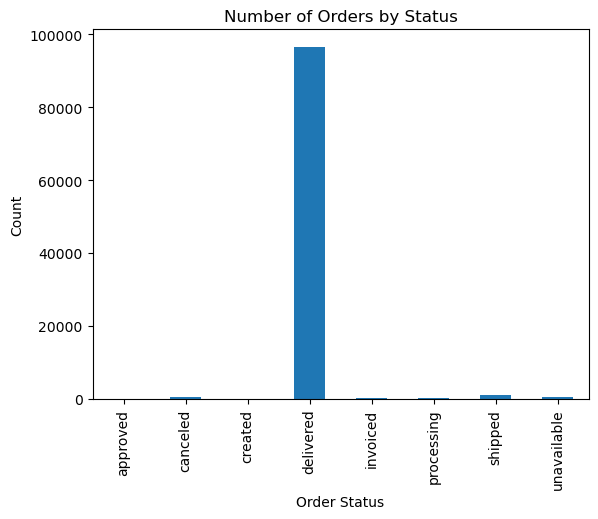

In [7]:
# Count the unique values in the 'indicator_type' column
status_types = orders['order_status'].unique()

# Get the count of orders for each order_status type
status_counts = orders.groupby('order_status')['order_id'].count()

# Create a bar plot
status_counts.plot(kind='bar')

# Set the axis labels and title
plt.xlabel('Order Status')
plt.ylabel('Count')
plt.title('Number of Orders by Status')

# Show the plot
plt.show()

we focus solely on the delivered data, we will disregard any other order status types and exclude them from our analysis

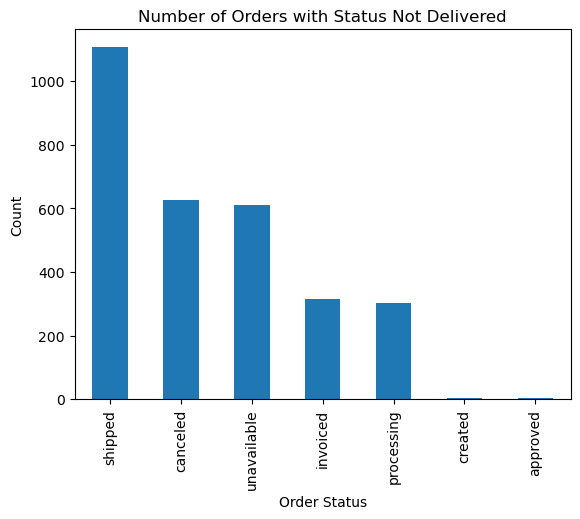

In [8]:
# Get the count of orders with status not equal to 'delivered'
not_delivered = orders.loc[orders['order_status'] != 'delivered']
status_counts = not_delivered['order_status'].value_counts()

# Create a bar plot
status_counts.plot(kind='bar')

# Set the axis labels and title
plt.xlabel('Order Status')
plt.ylabel('Count')
plt.title('Number of Orders with Status Not Delivered')

# Show the plot
plt.show()


In [9]:
#drop these Status Not Delivered
orders.dropna(inplace = True)


# updated order_ID
orders.count()

order_id                         96476
customer_id                      96476
order_status                     96476
order_purchase_timestamp         96476
order_delivered_customer_date    96476
order_estimated_delivery_date    96476
dtype: int64

### Transform the column into its appropriate data type.

In [10]:
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])
orders['order_delivered_customer_date'] = pd.to_datetime(orders['order_delivered_customer_date'])
orders['order_estimated_delivery_date'] = pd.to_datetime(orders['order_estimated_delivery_date'])
orders['order_status'] = orders['order_status'].astype('category')


orders.dtypes


order_id                                 object
customer_id                              object
order_status                           category
order_purchase_timestamp         datetime64[ns]
order_delivered_customer_date    datetime64[ns]
order_estimated_delivery_date    datetime64[ns]
dtype: object

In [11]:
# Calculate the delivery days and delay
orders['delivery_days'] = (orders['order_delivered_customer_date'] - orders['order_purchase_timestamp']).dt.days
orders['delay'] = (orders['order_delivered_customer_date'] - orders['order_estimated_delivery_date']).dt.days

# View the updated dataset
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_days,delay
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8,-8
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,13,-6
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,9,-18
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15,13,-13
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26,2,-10


In [12]:
orders["order_id"].nunique()

96476

## Dataset 2: olist_order_items_dataset

In [13]:
order_items = pd.read_csv('Datasets/olist_order_items_dataset.csv')[ ['order_id','order_item_id',
 'product_id', 'seller_id', 'price', 'freight_value']]

order_items.head()

,order_id,order_item_id,product_id,seller_id,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14


In [14]:
order_items.count()

order_id         112650
order_item_id    112650
product_id       112650
seller_id        112650
price            112650
freight_value    112650
dtype: int64

In [15]:
order_items["order_id"].nunique()

98666

### Eliminate any other status type

In [16]:
incomplete_orders = orders["order_id"].nunique() - order_items["order_id"].nunique()
print(incomplete_orders)

-2190


In [17]:
order_items.head()


,order_id,order_item_id,product_id,seller_id,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14


## Dataset 3: olist_customers_dataset

In [18]:
customers = pd.read_csv('Datasets/olist_customers_dataset.csv')[ ['customer_id','customer_unique_id','customer_zip_code_prefix','customer_state']]

customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,SP


In [19]:
customers.count()

customer_id                 99441
customer_unique_id          99441
customer_zip_code_prefix    99441
customer_state              99441
dtype: int64

The provided dataset includes customer information and their corresponding location. We can use this information to identify unique customers in the orders dataset and determine the delivery location for each order. As each order is linked to a distinct customer_id, a single customer may have multiple customer_ids if they make multiple purchases from the store. The customer_unique_id field in the dataset facilitates the identification of repeat customers.

In [20]:
customers["customer_unique_id"].nunique()

96096

In [21]:
# Convert some columns to categorical data type
customers['customer_state'] = customers['customer_state'].astype('category')

customers.dtypes


customer_id                   object
customer_unique_id            object
customer_zip_code_prefix       int64
customer_state              category
dtype: object

## Dataset 4: olist_products_dataset

In [22]:
products = pd.read_csv('Datasets/olist_products_dataset.csv')[ ['product_id', 'product_category_name']]

products.head()

,product_id,product_category_name
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria
1,3aa071139cb16b67ca9e5dea641aaa2f,artes
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer
3,cef67bcfe19066a932b7673e239eb23d,bebes
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas


In [23]:
products.count()


product_id               32951
product_category_name    32341
dtype: int64

The olist_products_dataset contains missing data, with some product_ids not matching with a product_category_name and some product_category_names being empty. To address this, we can replace all null values for product_category_name with the label "uncategorized". By doing so, we can ensure that all products have a corresponding category. With this adjustment, the number of rows in product_id and product_category_name will match, indicating that all products are categorized.

In [24]:
products.isnull().values.sum() #number of Null values in category name


610

In [25]:
#replacing null values with "uncategorized"
products["product_category_name"].fillna("uncategorized", inplace = True)
products.count()

product_id               32951
product_category_name    32951
dtype: int64

## Dataset 5: olist_order_payments_dataset

In [26]:
payments = pd.read_csv('Datasets/olist_order_payments_dataset.csv')[ ['order_id', 'payment_type', 'payment_value']]

payments.head()

,order_id,payment_type,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,credit_card,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,credit_card,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,credit_card,65.71
3,ba78997921bbcdc1373bb41e913ab953,credit_card,107.78
4,42fdf880ba16b47b59251dd489d4441a,credit_card,128.45


In [27]:
payments.count()

order_id         103886
payment_type     103886
payment_value    103886
dtype: int64

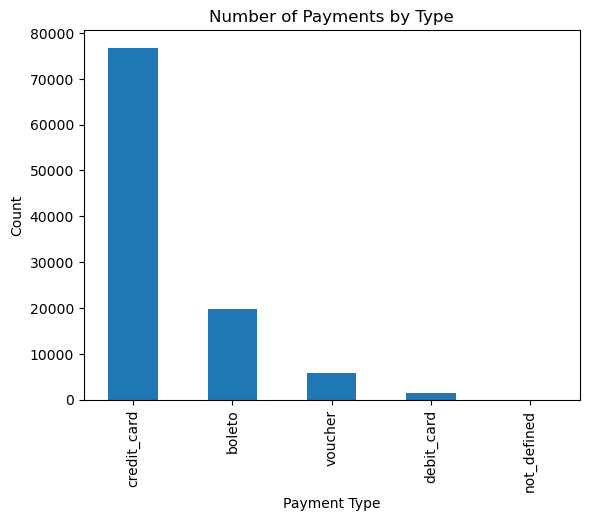

In [28]:
# Count the unique values in the 'payment_type' column

payment_counts = payments['payment_type'].value_counts()

# Get the count of payments for each payment type
payment_counts = payments['payment_type'].value_counts()

# Create a bar plot
payment_counts.plot(kind='bar')

# Set the axis labels and title
plt.xlabel('Payment Type')
plt.ylabel('Count')
plt.title('Number of Payments by Type')

# Show the plot
plt.show()

In [29]:
payments["order_id"].nunique()

99440

### Transform the column into its appropriate data type

In [30]:
payments = payments.astype({"payment_type" : 'category'})


## Dataset 6: olist_order_reviews_dataset

In [31]:
review = pd.read_csv('Datasets/olist_order_reviews_dataset.csv')[ ['order_id', 'review_id', 'review_score','review_comment_title','review_comment_message']]

review.head()

,order_id,review_id,review_score,review_comment_title,review_comment_message
0,73fc7af87114b39712e6da79b0a377eb,7bc2406110b926393aa56f80a40eba40,4,NaN,NaN
1,a548910a1c6147796b98fdf73dbeba33,80e641a11e56f04c1ad469d5645fdfde,5,NaN,NaN
2,f9e4b658b201a9f2ecdecbb34bed034b,228ce5500dc1d8e020d8d1322874b6f0,5,NaN,NaN
3,658677c97b385a9be170737859d3511b,e64fb393e7b32834bb789ff8bb30750e,5,NaN,Recebi bem antes do prazo estipulado.
4,8e6bfb81e283fa7e4f11123a3fb894f1,f7c4243c7fe1938f181bec41a392bdeb,5,NaN,Parabéns lojas lannister adorei comprar pela I...


In [32]:
review.count()

order_id                  99224
review_id                 99224
review_score              99224
review_comment_title      11568
review_comment_message    40977
dtype: int64

In [33]:
review["order_id"].nunique()

98673

In [34]:
review.isnull().sum()

order_id                      0
review_id                     0
review_score                  0
review_comment_title      87656
review_comment_message    58247
dtype: int64

We observed that many rows in the dataset do not have any review or review comment titles. This may be because a significant number of customers do not provide feedback after making a purchase, Therefore, we have opted to eliminate these columns.

In [35]:
review = review.drop(columns=['review_comment_title', 'review_comment_message'])
review.head()

,order_id,review_id,review_score
0,73fc7af87114b39712e6da79b0a377eb,7bc2406110b926393aa56f80a40eba40,4
1,a548910a1c6147796b98fdf73dbeba33,80e641a11e56f04c1ad469d5645fdfde,5
2,f9e4b658b201a9f2ecdecbb34bed034b,228ce5500dc1d8e020d8d1322874b6f0,5
3,658677c97b385a9be170737859d3511b,e64fb393e7b32834bb789ff8bb30750e,5
4,8e6bfb81e283fa7e4f11123a3fb894f1,f7c4243c7fe1938f181bec41a392bdeb,5


## Dataset 7: olist_geolocation_dataset

In [36]:
geo_loc = pd.read_csv('Datasets/olist_geolocation_dataset.csv')[ ['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng','geolocation_city','geolocation_state']]

geo_loc.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [37]:
geo_loc.count()

geolocation_zip_code_prefix    1000163
geolocation_lat                1000163
geolocation_lng                1000163
geolocation_city               1000163
geolocation_state              1000163
dtype: int64

In [38]:
geo_loc.isnull().sum()

geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geolocation_city               0
geolocation_state              0
dtype: int64

In [39]:
geo_loc["geolocation_state"].nunique()
unique_states = geo_loc["geolocation_state"].unique()
print("Unique states: ", unique_states)



Unique states:  ['SP' 'RN' 'AC' 'RJ' 'ES' 'MG' 'BA' 'SE' 'PE' 'AL' 'PB' 'CE' 'PI' 'MA'
 'PA' 'AP' 'AM' 'RR' 'DF' 'GO' 'RO' 'TO' 'MT' 'MS' 'RS' 'PR' 'SC']


In [40]:
# Convert some columns to categorical data type
geo_loc['geolocation_state'] = geo_loc['geolocation_state'].astype('category')

## Cleaning Data: Translating Brazilian language to the English language 

In [41]:
translate = pd.read_csv('Datasets/product_category_name_translation.csv')
translate.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [42]:
translate.count()

product_category_name            71
product_category_name_english    71
dtype: int64

### We replaced all null values in the product_category_name column with the label "uncategorized"

In [43]:
#append new row 'uncategorized'
data ={'product_category_name':'uncategorized', 'product_category_name_english':'uncategorized'}
translate= translate.append(data, ignore_index=True)


C:\Users\evawo\AppData\Local\Temp\ipykernel_11580\1278005239.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  translate= translate.append(data, ignore_index=True)


In [44]:
translate

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
...,...,...
67,artes_e_artesanato,arts_and_craftmanship
68,fraldas_higiene,diapers_and_hygiene
69,fashion_roupa_infanto_juvenil,fashion_childrens_clothes
70,seguros_e_servicos,security_and_services


In [45]:
translate.count()


product_category_name            72
product_category_name_english    72
dtype: int64

In [46]:
translate['product_category_name_english'] = translate['product_category_name_english'].astype('category')
translate['product_category_name'] = translate['product_category_name'].astype('category')

# Joining datasets

In [47]:

orders = orders.loc[:, ['order_id', 'customer_id', 'order_purchase_timestamp', 'order_delivered_customer_date','order_estimated_delivery_date','delivery_days','delay']]
order_items = order_items.loc[:, ['order_id','order_item_id', 'product_id', 'seller_id', 'price', 'freight_value']]
customers = customers.loc[:, ['customer_id', 'customer_unique_id','customer_zip_code_prefix','customer_state']]
products = products.loc[:, ['product_id', 'product_category_name']]
payments = payments.loc[:, ['order_id', 'payment_type', 'payment_value']]
review = review.loc[:, ['order_id', 'review_id', 'review_score']]
geo_loc = geo_loc.loc[:, ['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng','geolocation_city','geolocation_state']]
translate = translate.loc[:, ['product_category_name','product_category_name_english']]
sellers = sellers.loc[:, ['seller_id','seller_state']]

### Merge order_dataset and order_item_dataset on 'order_id', no. of data follows order_dataset

In [48]:
cleaned_data = orders.merge(order_items, on = 'order_id', how = 'left')
cleaned_data = cleaned_data.T.drop_duplicates().T
cleaned_data.head()

,order_id,customer_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_days,delay,order_item_id,product_id,seller_id,price,freight_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8,-8,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,13,-6,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.7,22.76
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,9,-18,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.9,19.22
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15,13,-13,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.0,27.2
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26,2,-10,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.9,8.72


In [49]:

print('Number of unique order id: ',cleaned_data["order_id"].nunique())

Number of unique order id:  96476


In [50]:
cleaned_data.count()


order_id                         110196
customer_id                      110196
order_purchase_timestamp         110196
order_delivered_customer_date    110196
order_estimated_delivery_date    110196
delivery_days                    110196
delay                            110196
order_item_id                    110196
product_id                       110196
seller_id                        110196
price                            110196
freight_value                    110196
dtype: int64

### Merge customer_dataset and cleaned_data on 'customer_id', no. of data follows the cleaned_data

In [51]:
cleaned_data = cleaned_data.merge(customers, on = 'customer_id', how = 'left')
cleaned_data = cleaned_data.T.drop_duplicates().T
cleaned_data.head()

,order_id,customer_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_days,delay,order_item_id,product_id,seller_id,price,freight_value,customer_unique_id,customer_zip_code_prefix,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8,-8,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,7c396fd4830fd04220f754e42b4e5bff,3149,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,13,-6,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.7,22.76,af07308b275d755c9edb36a90c618231,47813,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,9,-18,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.9,19.22,3a653a41f6f9fc3d2a113cf8398680e8,75265,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15,13,-13,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.0,27.2,7c142cf63193a1473d2e66489a9ae977,59296,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26,2,-10,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.9,8.72,72632f0f9dd73dfee390c9b22eb56dd6,9195,SP


In [52]:
cleaned_data.count()

order_id                         110196
customer_id                      110196
order_purchase_timestamp         110196
order_delivered_customer_date    110196
order_estimated_delivery_date    110196
delivery_days                    110196
delay                            110196
order_item_id                    110196
product_id                       110196
seller_id                        110196
price                            110196
freight_value                    110196
customer_unique_id               110196
customer_zip_code_prefix         110196
customer_state                   110196
dtype: int64

In [53]:
print('Number of unique order id: ',cleaned_data["order_id"].nunique())

Number of unique order id:  96476


In [54]:
print('Number of unique customer id: ',cleaned_data["customer_id"].nunique())


Number of unique customer id:  96476


### Merge products_dataset and cleaned_data on 'product_id', no. of data follows cleaned_data

In [55]:
cleaned_data = cleaned_data.merge(products, on = 'product_id', how = 'left')
cleaned_data = cleaned_data.T.drop_duplicates().T
cleaned_data.head()

,order_id,customer_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_days,delay,order_item_id,product_id,seller_id,price,freight_value,customer_unique_id,customer_zip_code_prefix,customer_state,product_category_name
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8,-8,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,7c396fd4830fd04220f754e42b4e5bff,3149,SP,utilidades_domesticas
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,13,-6,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.7,22.76,af07308b275d755c9edb36a90c618231,47813,BA,perfumaria
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,9,-18,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.9,19.22,3a653a41f6f9fc3d2a113cf8398680e8,75265,GO,automotivo
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15,13,-13,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.0,27.2,7c142cf63193a1473d2e66489a9ae977,59296,RN,pet_shop
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26,2,-10,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.9,8.72,72632f0f9dd73dfee390c9b22eb56dd6,9195,SP,papelaria


In [56]:
cleaned_data.count()

order_id                         110196
customer_id                      110196
order_purchase_timestamp         110196
order_delivered_customer_date    110196
order_estimated_delivery_date    110196
delivery_days                    110196
delay                            110196
order_item_id                    110196
product_id                       110196
seller_id                        110196
price                            110196
freight_value                    110196
customer_unique_id               110196
customer_zip_code_prefix         110196
customer_state                   110196
product_category_name            110196
dtype: int64

### Merge translated categories  and cleaned_data on 'product_category_name_english', no. of data follows cleaned_data

In [57]:
cleaned_data = cleaned_data.merge(translate, on = 'product_category_name', how = 'left')
cleaned_data = cleaned_data.T.drop_duplicates().T
cleaned_data.head()

,order_id,customer_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_days,delay,order_item_id,product_id,seller_id,price,freight_value,customer_unique_id,customer_zip_code_prefix,customer_state,product_category_name,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8,-8,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,7c396fd4830fd04220f754e42b4e5bff,3149,SP,utilidades_domesticas,housewares
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,13,-6,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.7,22.76,af07308b275d755c9edb36a90c618231,47813,BA,perfumaria,perfumery
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,9,-18,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.9,19.22,3a653a41f6f9fc3d2a113cf8398680e8,75265,GO,automotivo,auto
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15,13,-13,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.0,27.2,7c142cf63193a1473d2e66489a9ae977,59296,RN,pet_shop,pet_shop
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26,2,-10,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.9,8.72,72632f0f9dd73dfee390c9b22eb56dd6,9195,SP,papelaria,stationery


In [58]:
cleaned_data.count()

order_id                         110196
customer_id                      110196
order_purchase_timestamp         110196
order_delivered_customer_date    110196
order_estimated_delivery_date    110196
delivery_days                    110196
delay                            110196
order_item_id                    110196
product_id                       110196
seller_id                        110196
price                            110196
freight_value                    110196
customer_unique_id               110196
customer_zip_code_prefix         110196
customer_state                   110196
product_category_name            110196
product_category_name_english    110174
dtype: int64

### We notice that the original product name and translated product name have some discrepancy 

## Checking merged data

In [59]:
missing = cleaned_data['product_category_name_english'].isnull().sum()
print("Number of missing values in 'product_category_name_english':", missing)

missing_data = cleaned_data[cleaned_data['product_category_name_english'].isnull()]
print(missing_data)


Number of missing values in 'product_category_name_english': 22
                                order_id                       customer_id  \
1020    8dbdb81783a3c754dc9441826510a36a  2d0c34b4b379c290f079d39df12304e2   
2450    e4aac63ea6f6b75b6d91ead05207fb43  9aa2c4bac83761140a8703ebdf9e49bd   
8256    b35a771164a9defa3b4767f1b66918b1  db72b1bc11dfa3a7d4dc04332a77b651   
9983    b1829b9fc61d2f28d8668cd5bde29e3f  bd371cfbb78aa6bd8d2ad4dc52565d8f   
12416   542dd8c7a80f7006b56c9cbb95e6433b  416d7934b96e1c5d46b332d32ee0e356   
12859   d7ae3c10c3a4c7a721e64ba401ee745b  8622c629a0890a4ca20d1e7016e1a613   
19062   7faf8b9448b66f4a3ac98a312b3e7609  c0cc59cb5d494116de580acf7e6c46ac   
29595   d94600e5b855ffe8db3b9bc06e21b1bd  9f35486803ac72d115dedc28ef6156e1   
29596   d94600e5b855ffe8db3b9bc06e21b1bd  9f35486803ac72d115dedc28ef6156e1   
40564   804e5ddab73def7d5e86b8ae6f27e83b  ae9d8bf13681f31ec761764094e6ab95   
48598   94f94ebc2e26aeea2aa9e8945cb9fb0c  e00a5ec8d72cb3c5ed58f50fb1a55cbf   


### product_category_name like 'pc_gamer' and 'portateis_cozinha_e_preparadores_de_alimentos' did not have a corresponding product_category_name_english. Hence, we create the translation for it.

In [60]:
#append new row 'uncategorized'
kitchen = {'product_category_name':'portateis_cozinha_e_preparadores_de_alimentos',
        'product_category_name_english':'portable kitchen and food preparers'}

gamer = {'product_category_name':'pc_gamer',
        'product_category_name_english':'pc_gamer'}

translate = translate.append(kitchen, ignore_index=True)
translate = translate.append(gamer, ignore_index=True)
translate

C:\Users\evawo\AppData\Local\Temp\ipykernel_11580\4191585991.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  translate = translate.append(kitchen, ignore_index=True)
C:\Users\evawo\AppData\Local\Temp\ipykernel_11580\4191585991.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  translate = translate.append(gamer, ignore_index=True)


,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
...,...,...
69,fashion_roupa_infanto_juvenil,fashion_childrens_clothes
70,seguros_e_servicos,security_and_services
71,uncategorized,uncategorized
72,portateis_cozinha_e_preparadores_de_alimentos,portable kitchen and food preparers


In [61]:
cleaned_data = cleaned_data.merge(translate, on = 'product_category_name', how = 'left')
cleaned_data = cleaned_data.T.drop_duplicates().T
cleaned_data.head()

,order_id,customer_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_days,delay,order_item_id,product_id,seller_id,price,freight_value,customer_unique_id,customer_zip_code_prefix,customer_state,product_category_name,product_category_name_english_x,product_category_name_english_y
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8,-8,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,7c396fd4830fd04220f754e42b4e5bff,3149,SP,utilidades_domesticas,housewares,housewares
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,13,-6,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.7,22.76,af07308b275d755c9edb36a90c618231,47813,BA,perfumaria,perfumery,perfumery
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,9,-18,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.9,19.22,3a653a41f6f9fc3d2a113cf8398680e8,75265,GO,automotivo,auto,auto
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15,13,-13,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.0,27.2,7c142cf63193a1473d2e66489a9ae977,59296,RN,pet_shop,pet_shop,pet_shop
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26,2,-10,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.9,8.72,72632f0f9dd73dfee390c9b22eb56dd6,9195,SP,papelaria,stationery,stationery


### Original product name and translated product name are now tallies

In [62]:
cleaned_data.count()

order_id                           110196
customer_id                        110196
order_purchase_timestamp           110196
order_delivered_customer_date      110196
order_estimated_delivery_date      110196
delivery_days                      110196
delay                              110196
order_item_id                      110196
product_id                         110196
seller_id                          110196
price                              110196
freight_value                      110196
customer_unique_id                 110196
customer_zip_code_prefix           110196
customer_state                     110196
product_category_name              110196
product_category_name_english_x    110174
product_category_name_english_y    110196
dtype: int64

## Merge review_dataset and cleaned_data on 'order_id', no. of data follows cleaned_data

In [63]:
cleaned_data = cleaned_data.merge(review, on = 'order_id', how = 'left')
cleaned_data = cleaned_data.T.drop_duplicates().T
cleaned_data.head()

,order_id,customer_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_days,delay,order_item_id,product_id,seller_id,price,freight_value,customer_unique_id,customer_zip_code_prefix,customer_state,product_category_name,product_category_name_english_x,product_category_name_english_y,review_id,review_score
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8,-8,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,7c396fd4830fd04220f754e42b4e5bff,3149,SP,utilidades_domesticas,housewares,housewares,a54f0611adc9ed256b57ede6b6eb5114,4.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,13,-6,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.7,22.76,af07308b275d755c9edb36a90c618231,47813,BA,perfumaria,perfumery,perfumery,8d5266042046a06655c8db133d120ba5,4.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,9,-18,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.9,19.22,3a653a41f6f9fc3d2a113cf8398680e8,75265,GO,automotivo,auto,auto,e73b67b67587f7644d5bd1a52deb1b01,5.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15,13,-13,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.0,27.2,7c142cf63193a1473d2e66489a9ae977,59296,RN,pet_shop,pet_shop,pet_shop,359d03e676b3c069f62cadba8dd3f6e8,5.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26,2,-10,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.9,8.72,72632f0f9dd73dfee390c9b22eb56dd6,9195,SP,papelaria,stationery,stationery,e50934924e227544ba8246aeb3770dd4,5.0


## Merge sellers_dataset and cleaned_data on 'seller_ID', no. of data follows cleaned_data

In [64]:
cleaned_data = cleaned_data.merge(sellers, on = 'seller_id', how = 'left')
cleaned_data = cleaned_data.T.drop_duplicates().T
cleaned_data.head()

,order_id,customer_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_days,delay,order_item_id,product_id,seller_id,...,freight_value,customer_unique_id,customer_zip_code_prefix,customer_state,product_category_name,product_category_name_english_x,product_category_name_english_y,review_id,review_score,seller_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8,-8,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,...,8.72,7c396fd4830fd04220f754e42b4e5bff,3149,SP,utilidades_domesticas,housewares,housewares,a54f0611adc9ed256b57ede6b6eb5114,4.0,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,13,-6,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,...,22.76,af07308b275d755c9edb36a90c618231,47813,BA,perfumaria,perfumery,perfumery,8d5266042046a06655c8db133d120ba5,4.0,SP
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,9,-18,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,...,19.22,3a653a41f6f9fc3d2a113cf8398680e8,75265,GO,automotivo,auto,auto,e73b67b67587f7644d5bd1a52deb1b01,5.0,SP
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15,13,-13,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,...,27.2,7c142cf63193a1473d2e66489a9ae977,59296,RN,pet_shop,pet_shop,pet_shop,359d03e676b3c069f62cadba8dd3f6e8,5.0,MG
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26,2,-10,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,...,8.72,72632f0f9dd73dfee390c9b22eb56dd6,9195,SP,papelaria,stationery,stationery,e50934924e227544ba8246aeb3770dd4,5.0,SP


In [65]:
cleaned_data.count()

order_id                           110839
customer_id                        110839
order_purchase_timestamp           110839
order_delivered_customer_date      110839
order_estimated_delivery_date      110839
delivery_days                      110839
delay                              110839
order_item_id                      110839
product_id                         110839
seller_id                          110839
price                              110839
freight_value                      110839
customer_unique_id                 110839
customer_zip_code_prefix           110839
customer_state                     110839
product_category_name              110839
product_category_name_english_x    110817
product_category_name_english_y    110839
review_id                          110012
review_score                       110012
seller_state                       110839
dtype: int64

## Dropping unnecessary columns

In [66]:
cleaned_data.drop(['product_category_name_english_x','product_category_name', 'customer_id'], axis = 1, inplace=True)
cleaned_data

,order_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivery_days,delay,order_item_id,product_id,seller_id,price,freight_value,customer_unique_id,customer_zip_code_prefix,customer_state,product_category_name_english_y,review_id,review_score,seller_state
0,e481f51cbdc54678b7cc49136f2d6af7,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,8,-8,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,7c396fd4830fd04220f754e42b4e5bff,3149,SP,housewares,a54f0611adc9ed256b57ede6b6eb5114,4.0,SP
1,53cdb2fc8bc7dce0b6741e2150273451,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,13,-6,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.7,22.76,af07308b275d755c9edb36a90c618231,47813,BA,perfumery,8d5266042046a06655c8db133d120ba5,4.0,SP
2,47770eb9100c2d0c44946d9cf07ec65d,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,9,-18,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.9,19.22,3a653a41f6f9fc3d2a113cf8398680e8,75265,GO,auto,e73b67b67587f7644d5bd1a52deb1b01,5.0,SP
3,949d5b44dbf5de918fe9c16f97b45f8a,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15,13,-13,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.0,27.2,7c142cf63193a1473d2e66489a9ae977,59296,RN,pet_shop,359d03e676b3c069f62cadba8dd3f6e8,5.0,MG
4,ad21c59c0840e6cb83a9ceb5573f8159,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26,2,-10,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.9,8.72,72632f0f9dd73dfee390c9b22eb56dd6,9195,SP,stationery,e50934924e227544ba8246aeb3770dd4,5.0,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110834,63943bddc261676b46f01ca7ac2f7bd8,2018-02-06 12:58:58,2018-02-28 17:37:56,2018-03-02,22,-2,1,f1d4ce8c6dd66c47bbaa8c6781c2a923,1f9ab4708f3056ede07124aad39a2554,174.9,20.1,da62f9e57a76d978d02ab5362c509660,11722,SP,baby,29bb71b2760d0f876dfa178a76bc4734,4.0,SP
110835,83c1379a015df1e13d02aae0204711ab,2017-08-27 14:46:43,2017-09-21 11:24:17,2017-09-27,24,-6,1,b80910977a37536adeddd63663f916ad,d50d79cb34e38265a8649c383dcffd48,205.99,65.02,737520a9aad80b3fbbdad19b66b37b30,45920,BA,home_appliances_2,371579771219f6db2d830d50805977bb,5.0,SP
110836,11c177c8e97725db2631073c19f07b62,2018-01-08 21:28:27,2018-01-25 23:32:54,2018-02-15,17,-21,1,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99,40.59,5097a5312c8b157bb7be58ae360ef43c,28685,RJ,computers_accessories,8ab6855b9fe9b812cd03a480a25058a1,2.0,MG
110837,11c177c8e97725db2631073c19f07b62,2018-01-08 21:28:27,2018-01-25 23:32:54,2018-02-15,17,-21,2,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99,40.59,5097a5312c8b157bb7be58ae360ef43c,28685,RJ,computers_accessories,8ab6855b9fe9b812cd03a480a25058a1,2.0,MG


In [67]:
cleaned_data.dropna(subset=['review_id'], inplace=True)


## Reorganize the column for ease of visualizing the data

In [68]:
print(cleaned_data.iloc[0])


order_id                           e481f51cbdc54678b7cc49136f2d6af7
order_purchase_timestamp                        2017-10-02 10:56:33
order_delivered_customer_date                   2017-10-10 21:25:13
order_estimated_delivery_date                   2017-10-18 00:00:00
delivery_days                                                     8
delay                                                            -8
order_item_id                                                     1
product_id                         87285b34884572647811a353c7ac498a
seller_id                          3504c0cb71d7fa48d967e0e4c94d59d9
price                                                         29.99
freight_value                                                  8.72
customer_unique_id                 7c396fd4830fd04220f754e42b4e5bff
customer_zip_code_prefix                                       3149
customer_state                                                   SP
product_category_name_english_y                 

## Rename product_category_name_engish_y with product_category_name


In [69]:
cleaned_data.rename(columns = {'product_category_name_english_y':'product_category_name'}, inplace=True)


## Cleaned dataset


In [70]:
cleaned_data = cleaned_data[['customer_unique_id', 'customer_state','customer_zip_code_prefix', 'order_id', 'order_item_id','price','freight_value', 'order_purchase_timestamp','order_estimated_delivery_date','order_delivered_customer_date','delivery_days','delay','product_id', 'product_category_name','review_id', 'review_score','seller_id','seller_state']]
cleaned_data

,customer_unique_id,customer_state,customer_zip_code_prefix,order_id,order_item_id,price,freight_value,order_purchase_timestamp,order_estimated_delivery_date,order_delivered_customer_date,delivery_days,delay,product_id,product_category_name,review_id,review_score,seller_id,seller_state
0,7c396fd4830fd04220f754e42b4e5bff,SP,3149,e481f51cbdc54678b7cc49136f2d6af7,1,29.99,8.72,2017-10-02 10:56:33,2017-10-18,2017-10-10 21:25:13,8,-8,87285b34884572647811a353c7ac498a,housewares,a54f0611adc9ed256b57ede6b6eb5114,4.0,3504c0cb71d7fa48d967e0e4c94d59d9,SP
1,af07308b275d755c9edb36a90c618231,BA,47813,53cdb2fc8bc7dce0b6741e2150273451,1,118.7,22.76,2018-07-24 20:41:37,2018-08-13,2018-08-07 15:27:45,13,-6,595fac2a385ac33a80bd5114aec74eb8,perfumery,8d5266042046a06655c8db133d120ba5,4.0,289cdb325fb7e7f891c38608bf9e0962,SP
2,3a653a41f6f9fc3d2a113cf8398680e8,GO,75265,47770eb9100c2d0c44946d9cf07ec65d,1,159.9,19.22,2018-08-08 08:38:49,2018-09-04,2018-08-17 18:06:29,9,-18,aa4383b373c6aca5d8797843e5594415,auto,e73b67b67587f7644d5bd1a52deb1b01,5.0,4869f7a5dfa277a7dca6462dcf3b52b2,SP
3,7c142cf63193a1473d2e66489a9ae977,RN,59296,949d5b44dbf5de918fe9c16f97b45f8a,1,45.0,27.2,2017-11-18 19:28:06,2017-12-15,2017-12-02 00:28:42,13,-13,d0b61bfb1de832b15ba9d266ca96e5b0,pet_shop,359d03e676b3c069f62cadba8dd3f6e8,5.0,66922902710d126a0e7d26b0e3805106,MG
4,72632f0f9dd73dfee390c9b22eb56dd6,SP,9195,ad21c59c0840e6cb83a9ceb5573f8159,1,19.9,8.72,2018-02-13 21:18:39,2018-02-26,2018-02-16 18:17:02,2,-10,65266b2da20d04dbe00c5c2d3bb7859e,stationery,e50934924e227544ba8246aeb3770dd4,5.0,2c9e548be18521d1c43cde1c582c6de8,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110834,da62f9e57a76d978d02ab5362c509660,SP,11722,63943bddc261676b46f01ca7ac2f7bd8,1,174.9,20.1,2018-02-06 12:58:58,2018-03-02,2018-02-28 17:37:56,22,-2,f1d4ce8c6dd66c47bbaa8c6781c2a923,baby,29bb71b2760d0f876dfa178a76bc4734,4.0,1f9ab4708f3056ede07124aad39a2554,SP
110835,737520a9aad80b3fbbdad19b66b37b30,BA,45920,83c1379a015df1e13d02aae0204711ab,1,205.99,65.02,2017-08-27 14:46:43,2017-09-27,2017-09-21 11:24:17,24,-6,b80910977a37536adeddd63663f916ad,home_appliances_2,371579771219f6db2d830d50805977bb,5.0,d50d79cb34e38265a8649c383dcffd48,SP
110836,5097a5312c8b157bb7be58ae360ef43c,RJ,28685,11c177c8e97725db2631073c19f07b62,1,179.99,40.59,2018-01-08 21:28:27,2018-02-15,2018-01-25 23:32:54,17,-21,d1c427060a0f73f6b889a5c7c61f2ac4,computers_accessories,8ab6855b9fe9b812cd03a480a25058a1,2.0,a1043bafd471dff536d0c462352beb48,MG
110837,5097a5312c8b157bb7be58ae360ef43c,RJ,28685,11c177c8e97725db2631073c19f07b62,2,179.99,40.59,2018-01-08 21:28:27,2018-02-15,2018-01-25 23:32:54,17,-21,d1c427060a0f73f6b889a5c7c61f2ac4,computers_accessories,8ab6855b9fe9b812cd03a480a25058a1,2.0,a1043bafd471dff536d0c462352beb48,MG


In [71]:
cleaned_data.count()

customer_unique_id               110012
customer_state                   110012
customer_zip_code_prefix         110012
order_id                         110012
order_item_id                    110012
price                            110012
freight_value                    110012
order_purchase_timestamp         110012
order_estimated_delivery_date    110012
order_delivered_customer_date    110012
delivery_days                    110012
delay                            110012
product_id                       110012
product_category_name            110012
review_id                        110012
review_score                     110012
seller_id                        110012
seller_state                     110012
dtype: int64

<hr>

# 3. Exploratory Data Analysis/Visualization:

In [72]:
#Print the first five rows of the data
print(cleaned_data.head())

#Print the data information
print(cleaned_data.info())


                 customer_unique_id customer_state customer_zip_code_prefix  \
0  7c396fd4830fd04220f754e42b4e5bff             SP                     3149   
1  af07308b275d755c9edb36a90c618231             BA                    47813   
2  3a653a41f6f9fc3d2a113cf8398680e8             GO                    75265   
3  7c142cf63193a1473d2e66489a9ae977             RN                    59296   
4  72632f0f9dd73dfee390c9b22eb56dd6             SP                     9195   

                           order_id order_item_id  price freight_value  \
0  e481f51cbdc54678b7cc49136f2d6af7             1  29.99          8.72   
1  53cdb2fc8bc7dce0b6741e2150273451             1  118.7         22.76   
2  47770eb9100c2d0c44946d9cf07ec65d             1  159.9         19.22   
3  949d5b44dbf5de918fe9c16f97b45f8a             1   45.0          27.2   
4  ad21c59c0840e6cb83a9ceb5573f8159             1   19.9          8.72   

  order_purchase_timestamp order_estimated_delivery_date  \
0      2017-10-02 10

In [73]:
cleaned_data['price'] = cleaned_data['price'].astype(float)
cleaned_data['delivery_days'] = cleaned_data['delivery_days'].astype(int)
cleaned_data['delay'] = cleaned_data['delay'].astype(int)
cleaned_data['product_category_name'] = cleaned_data['product_category_name'].astype('category')
cleaned_data['seller_state'] = cleaned_data['seller_state'].astype('category')
cleaned_data['freight_value'] = cleaned_data['freight_value'].astype(float)
cleaned_data['review_score'] = cleaned_data['review_score'].astype(int)



In [74]:
print(cleaned_data.info())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 110012 entries, 0 to 110838
Data columns (total 18 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   customer_unique_id             110012 non-null  object        
 1   customer_state                 110012 non-null  object        
 2   customer_zip_code_prefix       110012 non-null  object        
 3   order_id                       110012 non-null  object        
 4   order_item_id                  110012 non-null  object        
 5   price                          110012 non-null  float64       
 6   freight_value                  110012 non-null  float64       
 7   order_purchase_timestamp       110012 non-null  datetime64[ns]
 8   order_estimated_delivery_date  110012 non-null  datetime64[ns]
 9   order_delivered_customer_date  110012 non-null  datetime64[ns]
 10  delivery_days                  110012 non-null  int32         
 11  

### Now that we have the cleaned data, we can move on to exploring the data to find patterns, trends, and insights that can help us improve the sales and marketing strategy.

# Customer behavior analysis
To show customer behavior, we use various visualizations and metrics to understand different aspects of customer actions and patterns. 

## a) Order patterns between the locations of customers and sellers

Text(345.72222222222223, 0.5, 'Seller State')

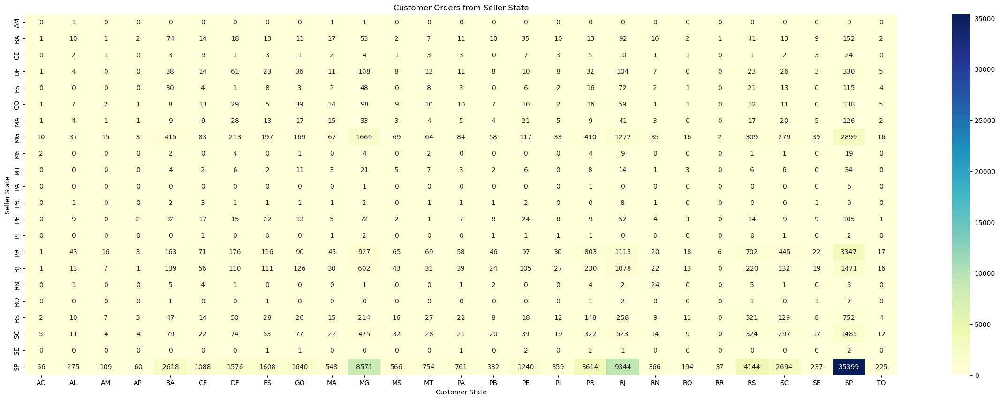

In [75]:
# create a new dataframe to group the order count based on the seller_state and customer_state
seller_customer_state = cleaned_data.groupby(['seller_state', 'customer_state']).size().reset_index(name='order_count')

# plot the heatmap to visualize the order count
plt.figure(figsize=(30,10))
sns.heatmap(pd.pivot_table(seller_customer_state, values='order_count', index=['seller_state'], columns=['customer_state']), cmap="YlGnBu", annot=True, fmt=".0f")
plt.title('Customer Orders from Seller State')
plt.xlabel('Customer State')
plt.ylabel('Seller State')


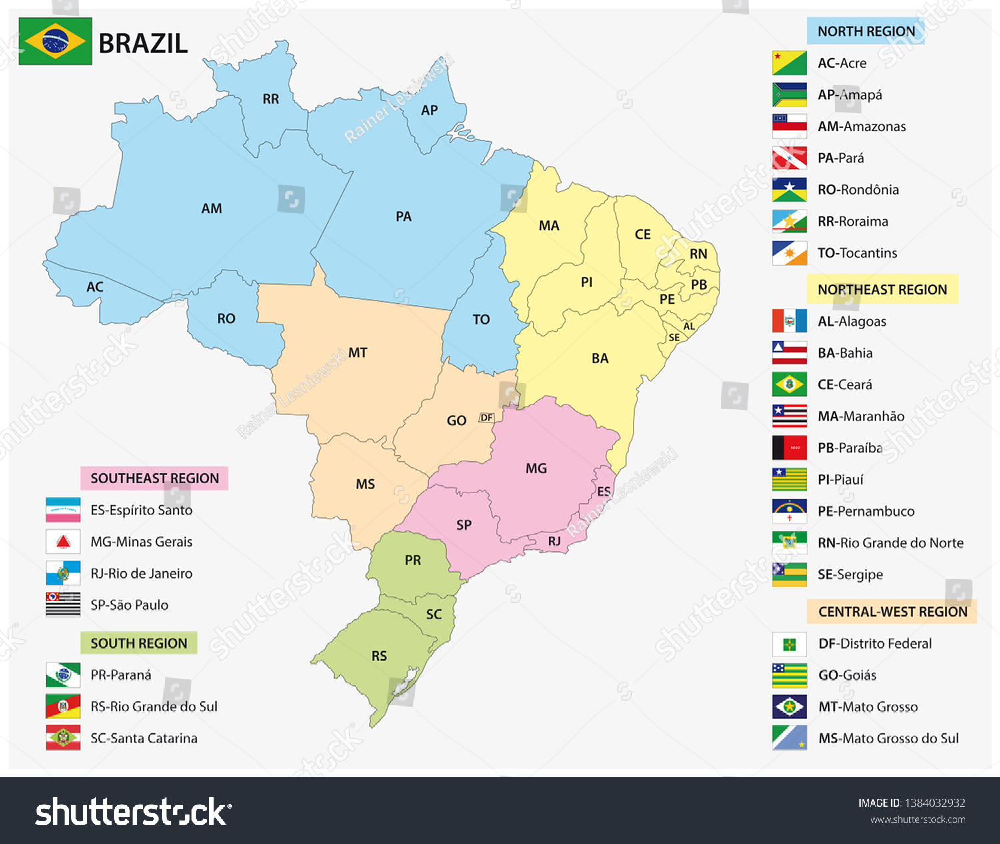

In [76]:
from IPython.display import Image
Image(filename="Images/brazil-map.jpg", width=600, height=300)

This visualization shows the relationship between the seller state and customer state in terms of the number of orders placed by customers from each state for sellers from each state.

The darker color represents a higher number of orders. From this heatmap, we can infer the following:

Most orders come from customers in the same state as the seller. This is evident by the dark diagonal line in the heatmap.

There are a significant number of orders from customers in other states as well, especially for sellers in the states of Sao Paulo, Minas Gerais, and Rio de Janeiro.

The states of Sao Paulo, Rio de Janeiro, and Minas Gerais have the highest number of orders, indicating that these are the most active states in terms of e-commerce activity.

The map reveals that OList operates within a limited geographic area, with a relatively small number of customers situated in the northern states, while the majority of its customer base is concentrated in the State of São Paulo.

Overall, this heatmap gives a good understanding of the relationship between the seller state and customer state in terms of order count and provides insights into the e-commerce market in Brazil.

## b) Calculate the total amount spent by each customer

C:\Users\evawo\AppData\Local\Temp\ipykernel_11580\3338232780.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(bin_labels, rotation=45, ha='right')


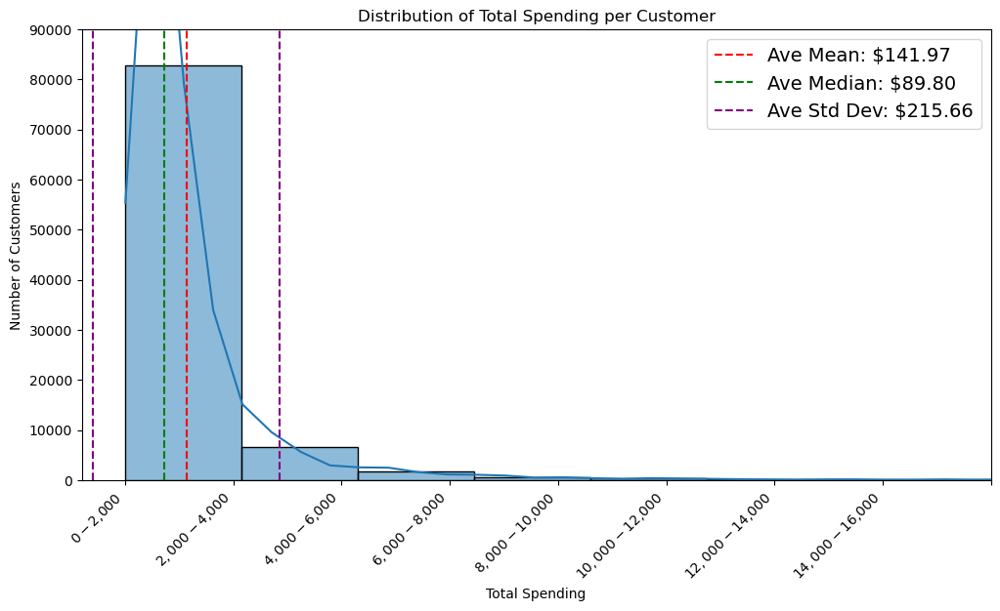

In [77]:
customer_spending = cleaned_data.groupby('customer_unique_id')['price'].sum()

# Create a figure with a histogram
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the histogram
sns.histplot(customer_spending, bins=50, kde=True, ax=ax, palette='Blues')



# Add descriptive statistics to the plot
mean = np.mean(customer_spending)
median = np.median(customer_spending)
std_dev = np.std(customer_spending)
ax.axvline(mean, color='red', linestyle='--', label='Ave Mean: ${:,.2f}'.format(mean))
ax.axvline(median, color='green', linestyle='--', label='Ave Median: ${:,.2f}'.format(median))
ax.axvline(mean - std_dev, color='purple', linestyle='--', label='Ave Std Dev: ${:,.2f}'.format(std_dev))
ax.axvline(mean + std_dev, color='purple', linestyle='--')

# Add labels to bins
bins = ax.get_xticks()
bin_labels = ['${:,.0f} - ${:,.0f}'.format(bins[i], bins[i+1]) for i in range(len(bins)-1)]
ax.set_xticklabels(bin_labels, rotation=45, ha='right')

ax.set_xlim([-100, 2000])
ax.set_ylim([0, 90000])



# Add a title
ax.set_title('Distribution of Total Spending per Customer')

# Add labels to axes
ax.set_xlabel('Total Spending')
ax.set_ylabel('Number of Customers')

# Increase font size
plt.rcParams.update({'font.size': 14})

# Add a legend
ax.legend()

# Show the plot
plt.show()



##  c) Top and bottom 10 customers by spending

In [78]:
# Get the top 10 customers by spending
top_spenders = cleaned_data.groupby('customer_unique_id')['price'].sum().nlargest(10)
print('Top 10 spenders:')
print(top_spenders)

# Get the bottom 10 customers by spending
bottom_spenders = cleaned_data.groupby('customer_unique_id')['price'].sum().nsmallest(10)
print('Bottom 10 spenders:')
print(bottom_spenders)


Top 10 spenders:
customer_unique_id
0a0a92112bd4c708ca5fde585afaa872    13440.00
da122df9eeddfedc1dc1f5349a1a690c     7388.00
763c8b1c9c68a0229c42c9fc6f662b93     7160.00
dc4802a71eae9be1dd28f5d788ceb526     6735.00
ff4159b92c40ebe40454e3e6a7c35ed6     6499.00
4007669dec559734d6f53e029e360987     5934.60
eebb5dda148d3893cdaf5b5ca3040ccb     4690.00
48e1ac109decbb87765a3eade6854098     4590.00
a229eba70ec1c2abef51f04987deb7a5     4400.00
edde2314c6c30e864a128ac95d6b2112     4399.87
Name: price, dtype: float64
Bottom 10 spenders:
customer_unique_id
b38211bd797f4fdd81a98b9d1754b606    0.85
d80730c15c647bc8f2ad77c908ba5ca9    0.85
317cfc692e3f86c45c95697c61c853a6    2.20
bd06ce0e06ad77a7f681f1a4960a3cc6    2.29
cf3839da0d9492ad151690b65f45d800    2.99
44eba5de8af60ec8b057ab4983f0868a    3.00
6d6065917074c293416673faaba09336    3.00
b33336f46234b24a613ad9064d13106d    3.50
84b4ea17e1ba0e30dd2b6e71937b6821    3.54
2878e5b88167faab17d4fb83a986d38b    3.85
Name: price, dtype: float64


###  What we can infer from the data: 
this plot suggests that while there are some high-spending customers, the majority of customers spent relatively small amounts. It also indicates that e-commerce companies may want to focus on increasing customer spending by incentivizing them to spend more, perhaps through loyalty programs or targeted marketing campaigns.




## d) Purchase frequency
This metric represents how often customers make a purchase. By analyzing purchase frequency, we can identify patterns in customer behavior and create targeted marketing campaigns to increase sales.

C:\Users\evawo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


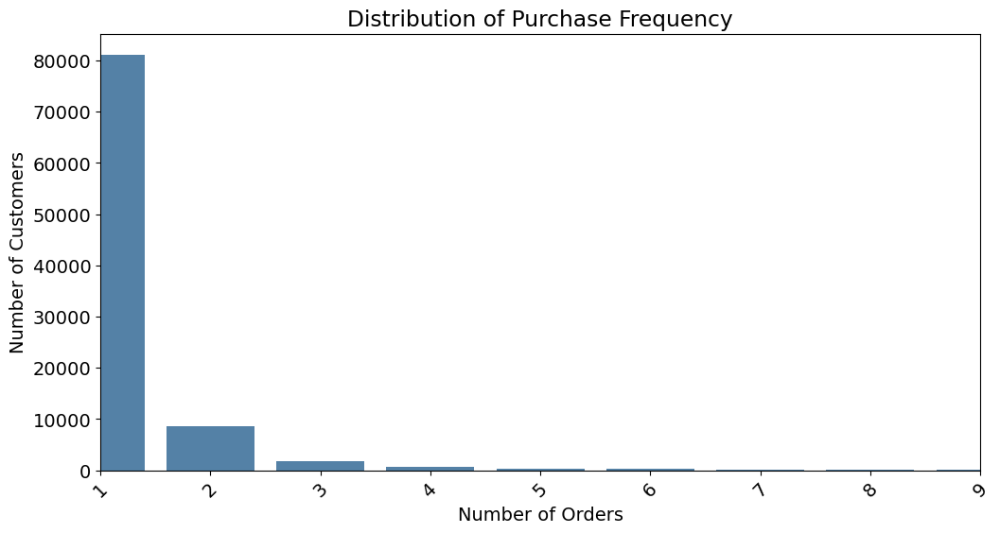

In [79]:
# Group the data by customer and count the number of orders made by each customer
order_count = cleaned_data.groupby('customer_unique_id')['order_id'].count()

# Create a figure with a bar plot
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the bar plot
sns.countplot(order_count, ax=ax, color='steelblue')

# Add a title
ax.set_title('Distribution of Purchase Frequency')

# Add labels to axes
ax.set_xlabel('Number of Orders')
ax.set_ylabel('Number of Customers')

# Set x-tick labels rotation
plt.xticks(rotation=45)

# Increase font size
plt.rcParams.update({'font.size': 14})


ax.set_xlim([0, 8])

# Show the plot
plt.show()


### From the purchase frequency analysis, 
we can infer that the majority of customers make a single purchase during the period covered by the dataset. This could suggest that the e-commerce platform is attracting a lot of one-time buyers, rather than fostering loyalty among customers.

However, there is also a significant portion of customers who make multiple purchases, with a small number of customers making more than 10 purchases. This could indicate that there is potential for the e-commerce platform to increase customer loyalty and encourage repeat purchases.

Overall, understanding customer purchase behavior can help businesses identify areas for improvement in their marketing, customer service, and product offerings, ultimately leading to increased customer satisfaction and sales.

## e) Calculate the repeat purchase rate

In [80]:
# Count the number of orders made by each customer
order_count = cleaned_data.groupby('customer_unique_id')['order_id'].count()

# Count the number of customers who made more than one order
repeat_customers = (order_count > 1).sum()

# Calculate the repeat purchase rate
total_customers = cleaned_data['customer_unique_id'].nunique()
repeat_purchase_rate = repeat_customers / total_customers

print(f"Repeat purchase rate: {repeat_purchase_rate:.2%}")


Repeat purchase rate: 12.47%


 ### From the repeat purchase rate: 
A lower repeat purchase rate, on the other hand, indicates that the customers are less loyal and may not return to make future purchases. This information can be used by the e-commerce platform to improve customer retention strategies and enhance customer loyalty.

## f) Pattern of changes in the amount of trading activity on a monthly basis

### Visualising using Line Chart

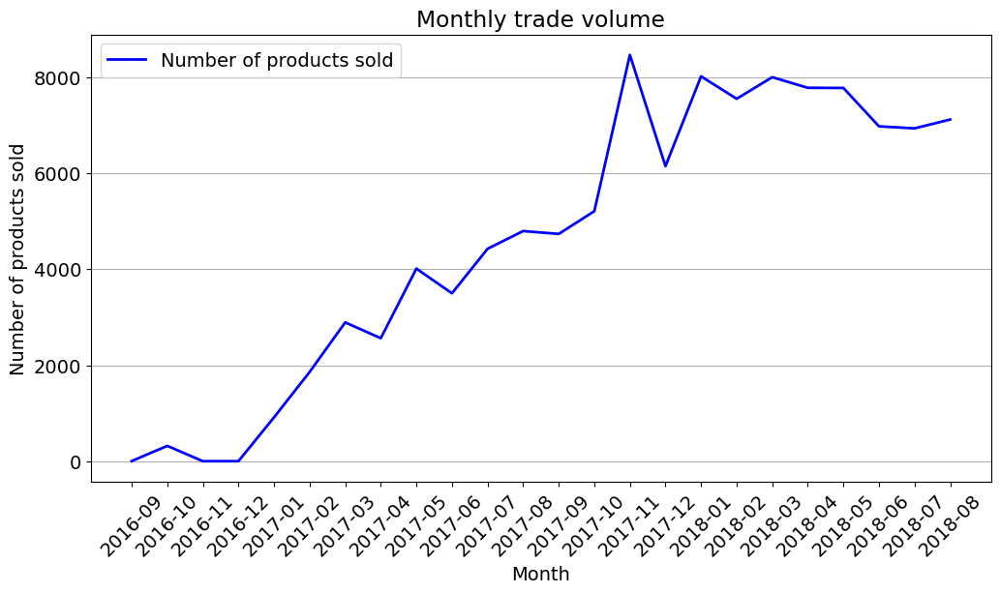

In [81]:
# Group the data by month and count the number of products sold each month
monthProducts = cleaned_data.groupby(pd.Grouper(key='order_purchase_timestamp', freq='M'))['product_id'].count()

# Create a line plot of the monthly trade volume
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(monthProducts.index.strftime('%Y-%m'), monthProducts.values, color='blue', linewidth=2)

# Add grid lines
ax.grid(axis='y')

# Increase font size
plt.rcParams.update({'font.size': 14})

# Add labels and title
ax.set_xlabel('Month')
ax.set_ylabel('Number of products sold')
ax.set_title('Monthly trade volume')

# Rotate x-axis labels
plt.xticks(rotation=45)

# Add legend
ax.legend(['Number of products sold'], loc='upper left')

# Show the plot
plt.show()



### Visualising using Heatmap 

In [82]:
# Group the data by month and product category and count the number of products sold each month
monthCategoryProducts = cleaned_data.groupby([pd.Grouper(key='order_purchase_timestamp', freq='M'), 'product_category_name'])['product_id'].count().reset_index()

# Pivot the data to create a heatmap
heatmapData = monthCategoryProducts.pivot_table(values='product_id', index=pd.Grouper(key='order_purchase_timestamp', freq='M'), columns='product_category_name')

# Fill NaN values with 0 and convert the data to integer
heatmapData = heatmapData.fillna(0).astype(int)

# Transpose the data to make the product categories the rows and the months the columns
heatmapData = heatmapData.transpose()

# Create a heatmap
plt.figure(figsize=(50,50), dpi = 350)
sns.set(font_scale=2)
sns.heatmap(heatmapData, vmin=0, vmax=heatmapData.values.max(), annot=True, fmt='d', cmap='flare')

# Add labels and title
plt.xlabel('Month')
plt.ylabel('Product Category')
plt.title('Product Categories Sold per Month')

# Show the plot
plt.show()


C:\Users\evawo\anaconda3\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\evawo\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


From the heatmap:

We can infer the product categories that are popular in each month of the year. The number of products sold has generally been increasing over time, with some fluctuations.

There seems to be a seasonal pattern with higher sales during the holiday months of November and December. 

The period between February and April appears to have the lowest sales.

We can see that in December, the product categories of health and beauty, bed bath table, and housewares are the most popular. 

In February, the category of health and beauty is still popular, but the category of fashion accessories is also popular.

In June, the category of sports and leisure is the most popular.

This information can be useful for businesses to make decisions on when to focus on certain product categories based on the time of year.

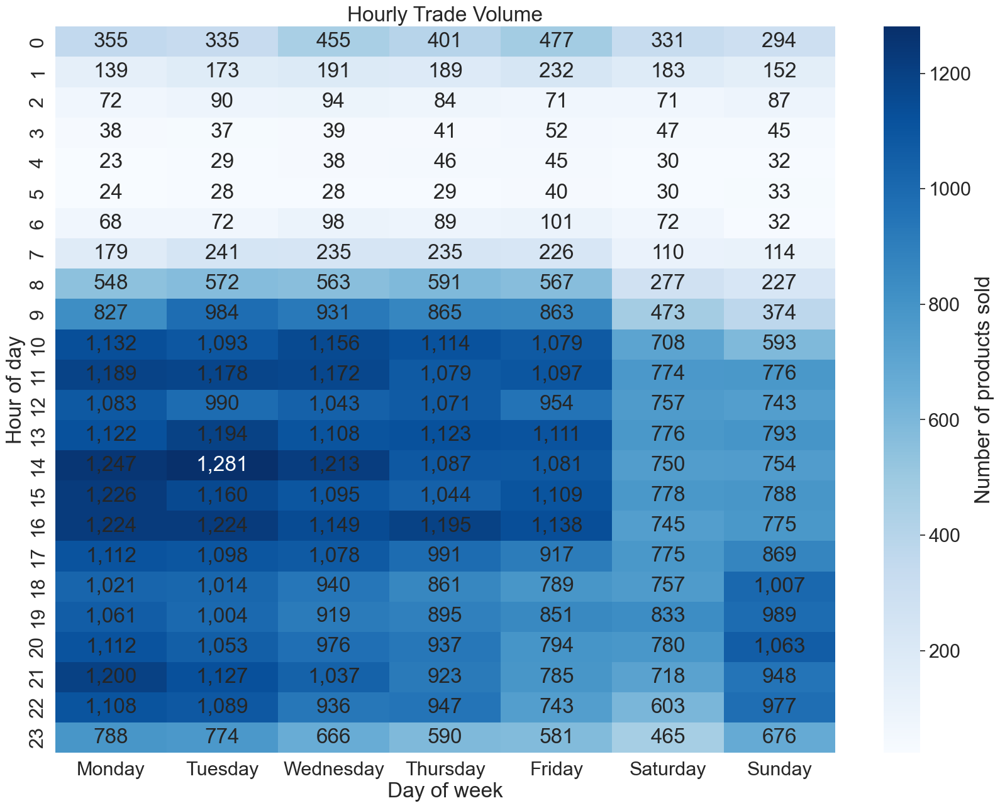

In [83]:

# Group the data by day of week and count the number of products sold each day
dayProducts = cleaned_data.groupby(pd.to_datetime(cleaned_data['order_purchase_timestamp']).dt.dayofweek)['product_id'].count()

# Group the data by day of week and hour of day and count the number of products sold each hour
hourly_data = cleaned_data.groupby([pd.to_datetime(cleaned_data['order_purchase_timestamp']).dt.dayofweek, pd.to_datetime(cleaned_data['order_purchase_timestamp']).dt.hour])['product_id'].count()

# Define the order of days of the week
dayNames = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Create a heatmap of the hourly trade volume
hourly_data = hourly_data.unstack(level=0)
fig, ax = plt.subplots(figsize=(20, 15))
sns.heatmap(hourly_data, cmap="Blues", ax=ax, cbar=True, cbar_kws={"label": "Number of products sold"})

# Add annotations for the highest value for each hour of the day
for i in range(7):
    for j in range(24):
        value = hourly_data.iloc[j, i]
        if value == hourly_data.max().max():
            text = ax.text(i + 0.5, j + 0.5, f"{value:,}", ha='center', va='center', color='white')
        else:
            text = ax.text(i + 0.5, j + 0.5, f"{value:,}", ha='center', va='center')

# Increase font size and add labels and title
plt.rcParams.update({'font.size': 15})
ax.set_xticklabels(dayNames, rotation=0)
ax.set_xlabel('Day of week')
ax.set_ylabel('Hour of day')
ax.set_title('Hourly Trade Volume')

# Remove grid lines
ax.grid(False)

# Show the plot
plt.show()


### What we can infer from the data: 

The heatmap shows that the busiest time of day for sales is between 10:00 and 16:00 on weekdays, with Tuesday being the most active day overall. On weekends, there is a more consistent level of sales throughout the day, with a slight peak in the afternoon. This information can be useful for businesses in the Brazilian e-commerce market to optimize their marketing and advertising strategies to reach their customers at the right time.

## g) Purchase pattern

### Number of products per category

[Text(0.5, 0, 'Categories'), Text(0, 0.5, 'Number of Products Sold')]

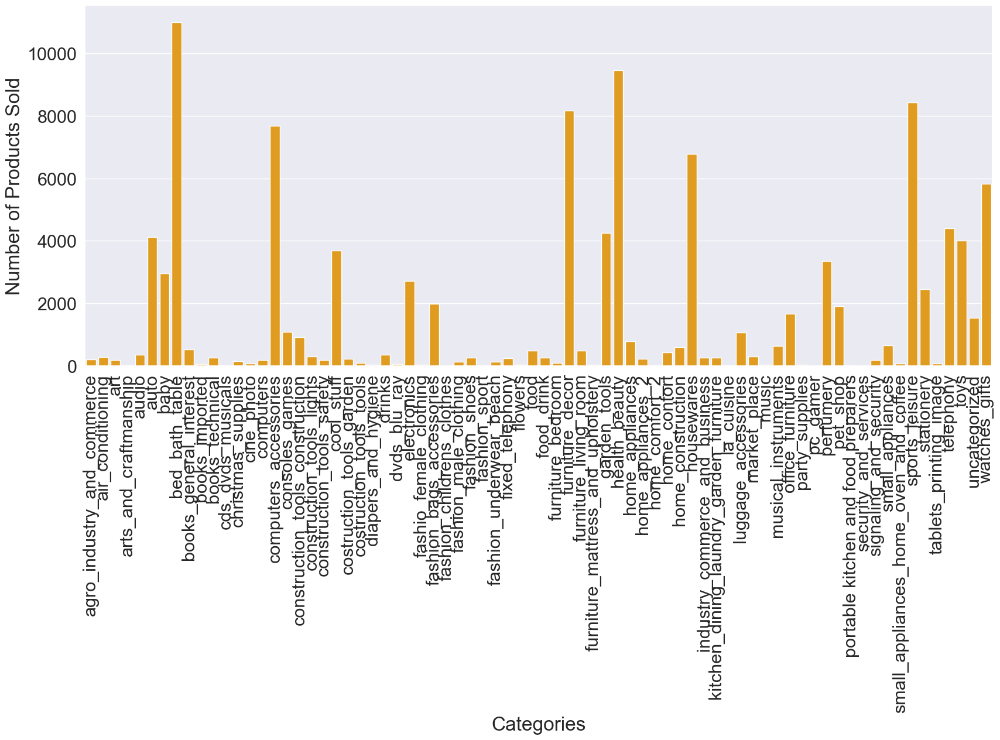

In [84]:
prod_cat = pd.DataFrame(cleaned_data['product_category_name'])
prod_cat = prod_cat.groupby(['product_category_name']).size().reset_index(name='count')
prod_cat = prod_cat.sort_values(by=['count'], ascending=False)  # Sort by count in descending order

f = plt.figure(figsize=(20, 8))
prod = sns.barplot(data=prod_cat, x='product_category_name', y='count', color='orange')
plt.xticks(rotation=90)
prod.set(xlabel='Categories', ylabel='Number of Products Sold')


### What we can infer from the data: 

The "bed_bath_table" and "health_beauty" categories have the highest number of products. "sports_leisure" and "furniture_decor" also has a significant number of products. On the other hand, "musical_instruments", "arts_and_craftmanship", and "security_and_services" have the lowest number of products. This information could be useful for business owners to understand which categories are popular and have high demand, and which categories may require more attention to increase sales.

### Top 3 Popular Categories

C:\Users\evawo\anaconda3\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\evawo\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


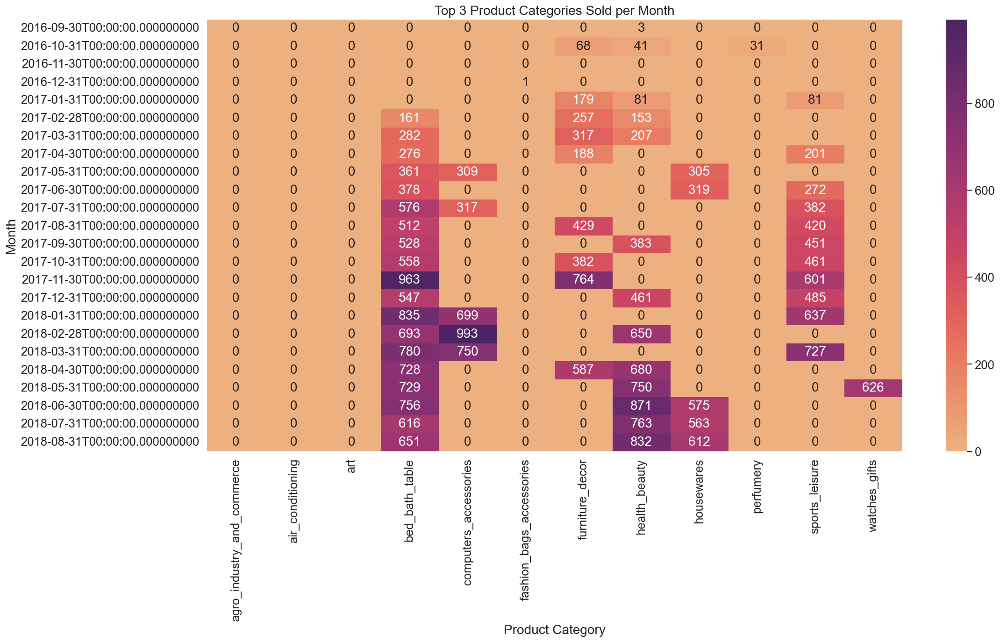

In [85]:
# Group the data by month and product category and count the number of products sold each month
monthCategoryProducts = cleaned_data.groupby([pd.Grouper(key='order_purchase_timestamp', freq='M'), 'product_category_name'])['product_id'].count().reset_index()

# Sort the data by month and product category in descending order
monthCategoryProducts = monthCategoryProducts.sort_values(['order_purchase_timestamp', 'product_id'], ascending=[False, False])

# Get the top 3 product categories sold per month
top3CategoryProducts = monthCategoryProducts.groupby('order_purchase_timestamp').head(3)

# Pivot the data to create a heatmap
heatmapData = top3CategoryProducts.pivot_table(values='product_id', index='product_category_name', columns='order_purchase_timestamp')

# Fill NaN values with 0 and convert the data to integer
heatmapData = heatmapData.fillna(0).astype(int)

# Transpose the data to make the product categories the rows and the months the columns
heatmapData = heatmapData.transpose()

# Create a heatmap
plt.figure(figsize=(20,10), dpi = 120)
sns.set(font_scale=1.4)
sns.heatmap(heatmapData, vmin=0, vmax=heatmapData.values.max(), annot=True, fmt='d', cmap='flare')

# Add labels and title
plt.xlabel('Product Category')
plt.ylabel('Month')
plt.title('Top 3 Product Categories Sold per Month')

# Show the plot
plt.show()


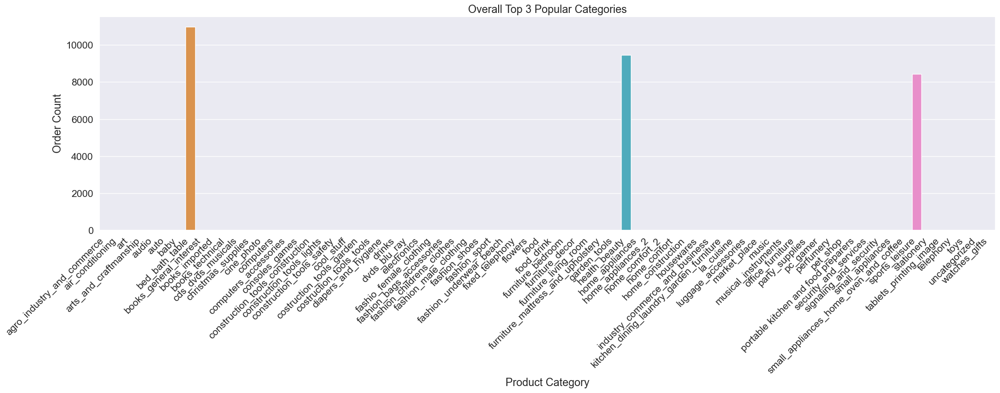

   product_category_name  order_count
7         bed_bath_table        10985
43         health_beauty         9458
67        sports_leisure         8436


In [86]:
# group the data by product_id and product_category_name_english and count the number of occurrences for each group
product_category_counts = cleaned_data.groupby(['product_id', 'product_category_name']).size().reset_index(name='order_count')

# select the top 3 popular categories
top_3_popular_categories = product_category_counts.groupby('product_category_name').sum().reset_index().sort_values('order_count', ascending=False).head(3)

# plot the top 3 popular categories as a bar chart
plt.figure(figsize=(25,6))
sns.barplot(x='product_category_name', y='order_count', data=top_3_popular_categories)
plt.title('Overall Top 3 Popular Categories')
plt.xlabel('Product Category')
plt.ylabel('Order Count')
plt.xticks(rotation=45, ha='right')
plt.show()

print(top_3_popular_categories)

###  What we can infer from the data
From the visualization, we can infer that the most popular categories of products sold in the Brazilian E-commerce dataset are "bed_bath_table", "health_beauty", "sports_leisure", "furniture_decor", "computers_accessories", "housewares", "watches_gifts", "telephony", "garden_tools", and "auto". This information can be useful for businesses that want to focus on selling products in these categories, as they are in high demand among customers. Additionally, it can help businesses optimize their supply chain and inventory management to meet the demand for these popular products.



# h) Review

## Review distribution


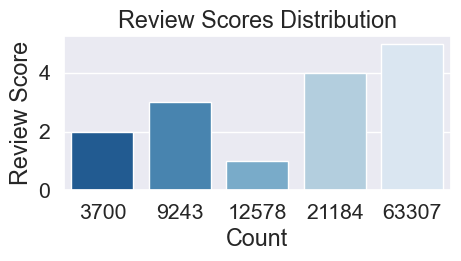

In [87]:
review_scores = cleaned_data['review_score'].value_counts().reset_index().rename(columns={'index': 'review_score', 'review_score': 'count'})

plt.figure(figsize=(5,2))
ax = sns.barplot(data=review_scores, x='count', y='review_score', palette='Blues_r')
ax.set_xlabel('Count')
ax.set_ylabel('Review Score')
ax.set_title('Review Scores Distribution')
plt.show()


## Review distribution by state

C:\Users\evawo\anaconda3\lib\site-packages\seaborn\categorical.py:381: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) < "3.0":
C:\Users\evawo\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


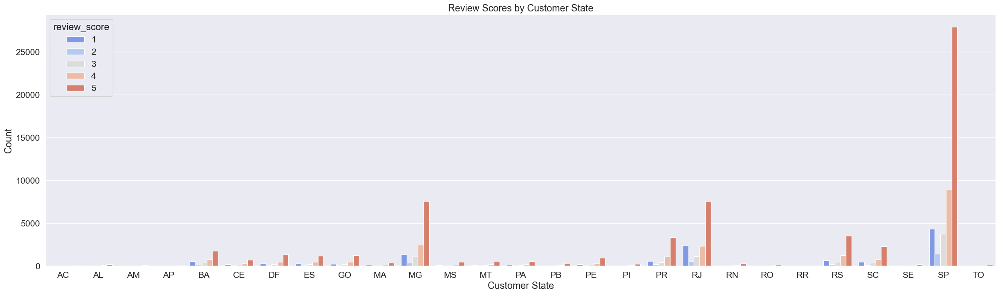

In [88]:
review_scores_by_state = cleaned_data.groupby(['customer_state', 'review_score']).size().reset_index(name='count')

plt.figure(figsize=(30,8))
sns.barplot(data=review_scores_by_state, x='customer_state', y='count', hue='review_score', palette='coolwarm')
plt.title('Review Scores by Customer State')
plt.xlabel('Customer State')
plt.ylabel('Count')
plt.show()


### From the bar plot:

we can see the distribution of review scores across different states in Brazil.

The plot shows that most of the states have a similar distribution of review scores, with the majority of customers giving a score of 5.

However, some states have a slightly higher percentage of low review scores (1 or 2) compared to others. For example, the state of Amapa has the highest percentage of 1 and 2 review scores, while the state of Paraiba has the lowest percentage of low review scores.

This information could be useful for businesses to identify regions where they may need to improve their customer service or product quality to increase customer satisfaction. It could also be used to compare the performance of different regions or to identify potential opportunities for expansion into new regions.

## Relationship between Delivery Days and Review Score

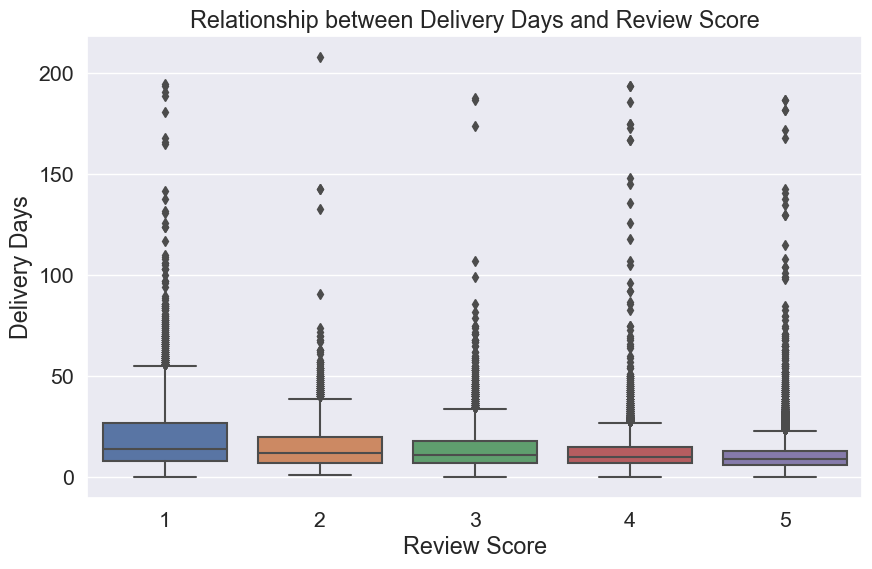

In [89]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='review_score', y='delivery_days', data=cleaned_data)
plt.title('Relationship between Delivery Days and Review Score')
plt.xlabel('Review Score')
plt.ylabel('Delivery Days')
plt.show()


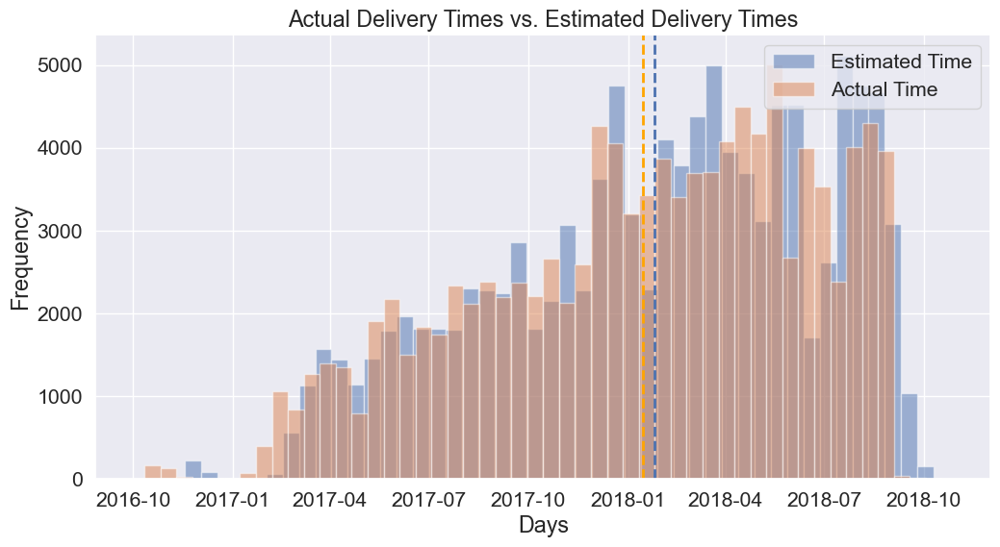

In [90]:
plt.figure(figsize=(12, 6))
plt.hist(cleaned_data['order_estimated_delivery_date'], bins=50, alpha=0.5, label='Estimated Time')
plt.hist(cleaned_data['order_delivered_customer_date'], bins=50, alpha=0.5, label='Actual Time')
plt.axvline(x=cleaned_data['order_estimated_delivery_date'].mean(), color='b', linestyle='dashed', linewidth=2)
plt.axvline(x=cleaned_data['order_delivered_customer_date'].mean(), color='orange', linestyle='dashed', linewidth=2)
plt.legend(loc='upper right')
plt.xlabel('Days')
plt.ylabel('Frequency')
plt.title('Actual Delivery Times vs. Estimated Delivery Times')
plt.show()


In [91]:
# Calculate percentage of orders delivered on time
on_time_perc = sum(cleaned_data['delay'] <= 0) / len(cleaned_data) * 100

print(f"Percentage of orders delivered on time: {on_time_perc:.2f}%")



Percentage of orders delivered on time: 93.53%


In [92]:
# Calculate percentage of orders delivered earlier than estimated
early_perc = sum(cleaned_data['delay'] < 0) / len(cleaned_data) * 100

print(f"Percentage of orders delivered earlier than estimated: {early_perc:.2f}%")


Percentage of orders delivered earlier than estimated: 92.22%


### From the boxplot:

we can see that the median delivery duration for all review scores is around 15 days, and the distribution of delivery duration for different review scores is quite similar, with some outliers in each category. 

However, we can see that customers who gave a lower review score (1-3) tend to have slightly longer delivery durations compared to customers who gave higher review scores (4-5). This may indicate that delivery duration can affect customer satisfaction and review scores to some extent. 

One possible reason for the high rating given by consumers could be the fact that 92.22% of deliveries were completed earlier than the estimated time
<hr>

# 4. Machine Learning Technique:
We could train a model to predict customer behavior and preferences.

After cleaning and exploring the data, the next step is to engineer new features that can help improve the performance of our model. 

We will also prepare the data for training by encoding categorical features, scaling numerical features, and splitting the data into training and testing sets.

We have tried a total of 4 types of Machine Learning Technique:
1. Association Rule Mining
2. Decision Tree
3. Linear Regression
4. Multi-variate Regression

## a) Association Rule Mining

The Association rule is a learning technique that helps identify the dependencies between two data items. Based on the dependency, it then maps accordingly so that it can be more profitable. Association rule furthermore looks for interesting associations among the variables of the dataset. 

An association rule has 2 parts:
- an antecedent (if): Found in data
- a consequent (then): Found in combination with the antecdant


Association rules are created by thoroughly analyzing data and looking for frequent if/then patterns. Then, depending on the following two parameters, the important relationships are observed:

- Support: Support indicates how frequently the if/then relationship appears in the database.
- Confidence: Confidence tells about the number of times these relationships have been found to be true.


To read this data, you can examine the antecedents and consequents columns to identify the products that were frequently purchased together. You can use the support, confidence, lift, and conviction metrics to assess the strength of the relationship between the antecedent and consequent sets.

- A higher support value indicates a higher frequency of co-occurrence, while a higher confidence value indicates a stronger conditional probability.
- A higher lift value indicates a stronger association between the antecedent and consequent sets than would be expected by chance.
- A higher conviction value indicates a stronger positive relationship between the antecedent and consequent sets. 

### Step 1: Selecting "order_id" and "product_category_name" 

In [93]:
# keep only relevant columns
df = cleaned_data[['order_id', 'product_category_name']]
df

,order_id,product_category_name
0,e481f51cbdc54678b7cc49136f2d6af7,housewares
1,53cdb2fc8bc7dce0b6741e2150273451,perfumery
2,47770eb9100c2d0c44946d9cf07ec65d,auto
3,949d5b44dbf5de918fe9c16f97b45f8a,pet_shop
4,ad21c59c0840e6cb83a9ceb5573f8159,stationery
...,...,...
110834,63943bddc261676b46f01ca7ac2f7bd8,baby
110835,83c1379a015df1e13d02aae0204711ab,home_appliances_2
110836,11c177c8e97725db2631073c19f07b62,computers_accessories
110837,11c177c8e97725db2631073c19f07b62,computers_accessories


In [94]:
# create list of unique items for each transaction
transactions = df.groupby(['order_id'])['product_category_name'].apply(list).tolist()
transactions

[['cool_stuff'],
 ['pet_shop'],
 ['furniture_decor'],
 ['perfumery'],
 ['garden_tools'],
 ['housewares'],
 ['telephony'],
 ['garden_tools'],
 ['health_beauty'],
 ['books_technical'],
 ['health_beauty'],
 ['fashion_bags_accessories'],
 ['bed_bath_table'],
 ['garden_tools', 'garden_tools'],
 ['sports_leisure'],
 ['consoles_games'],
 ['perfumery'],
 ['sports_leisure'],
 ['cool_stuff'],
 ['bed_bath_table'],
 ['telephony'],
 ['office_furniture'],
 ['fashion_bags_accessories'],
 ['cool_stuff'],
 ['sports_leisure'],
 ['luggage_accessories'],
 ['furniture_decor'],
 ['food'],
 ['furniture_decor'],
 ['agro_industry_and_commerce'],
 ['furniture_decor'],
 ['telephony'],
 ['electronics'],
 ['bed_bath_table'],
 ['garden_tools'],
 ['computers_accessories'],
 ['cool_stuff'],
 ['furniture_decor'],
 ['electronics', 'electronics', 'electronics'],
 ['construction_tools_construction'],
 ['computers_accessories'],
 ['bed_bath_table'],
 ['health_beauty', 'health_beauty'],
 ['pet_shop'],
 ['bed_bath_table'],


### Step 2: Encoding

In [95]:
# encode the transactions
te = TransactionEncoder()
te_ary = te.fit_transform(transactions)
df_encoded = pd.DataFrame(te_ary, columns=te.columns_)

df_encoded

,agro_industry_and_commerce,air_conditioning,art,arts_and_craftmanship,audio,auto,baby,bed_bath_table,books_general_interest,books_imported,...,signaling_and_security,small_appliances,small_appliances_home_oven_and_coffee,sports_leisure,stationery,tablets_printing_image,telephony,toys,uncategorized,watches_gifts
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95825,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
95826,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
95827,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
95828,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


### Step 3: Apriori algorithm

In [96]:
# generate frequent itemsets
frequent_itemsets = apriori(df_encoded, min_support=0.0001, use_colnames=True)
frequent_itemsets = frequent_itemsets.sort_values('support', ascending=False)

frequent_itemsets


,support,itemsets
7,0.095763,(bed_bath_table)
42,0.089774,(health_beauty)
64,0.078117,(sports_leisure)
15,0.067808,(computers_accessories)
38,0.065324,(furniture_decor)
...,...,...
77,0.000115,"(bed_bath_table, health_beauty)"
84,0.000115,"(housewares, garden_tools)"
87,0.000115,"(housewares, sports_leisure)"
80,0.000115,"(construction_tools_lights, furniture_decor)"


### Step 4: Generating Association Rules

In [97]:
# generate association rules
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=0.1)
rules = rules.sort_values('lift', ascending=False)

rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
3,(home_confort),(bed_bath_table),0.004070,0.095763,0.000449,0.110256,1.151343,0.000059,1.016289,0.131986
2,(bed_bath_table),(home_confort),0.095763,0.004070,0.000449,0.004686,1.151343,0.000059,1.000619,0.145370
12,(construction_tools_lights),(furniture_decor),0.002494,0.065324,0.000115,0.046025,0.704566,-0.000048,0.979770,-0.295954
13,(furniture_decor),(construction_tools_lights),0.065324,0.002494,0.000115,0.001757,0.704566,-0.000048,0.999262,-0.309687
8,(home_construction),(furniture_decor),0.005019,0.065324,0.000136,0.027027,0.413738,-0.000192,0.960639,-0.587482
9,(furniture_decor),(home_construction),0.065324,0.005019,0.000136,0.002077,0.413738,-0.000192,0.997051,-0.602547
4,(cool_stuff),(baby),0.036846,0.029083,0.000209,0.005664,0.194759,-0.000863,0.976448,-0.811062
5,(baby),(cool_stuff),0.029083,0.036846,0.000209,0.007176,0.194759,-0.000863,0.970115,-0.809828
7,(baby),(toys),0.029083,0.039382,0.000198,0.006817,0.173108,-0.000947,0.967212,-0.831076
6,(toys),(baby),0.039382,0.029083,0.000198,0.005034,0.173108,-0.000947,0.975830,-0.832568


### Step 5: Visualising 
Finally, we will be using a network graph to visualize the association rules between different product categories bought by customers. It uses the cleaned_data dataframe and extracts the relevant columns 'customer_unique_id' and 'product_category_name_english_y'.

For example, if a customer frequently buys "electronics" and "office supplies" together, an edge will be added between these two product categories with a higher support, confidence, and lift value. These association rules help to understand the buying behavior of customers and can be used to make business decisions like product placement, marketing, and bundling. The network graph helps to visualize the complex relationship between product categories, which is difficult to analyze by other means.

In [98]:
!pip install networkx==3.1

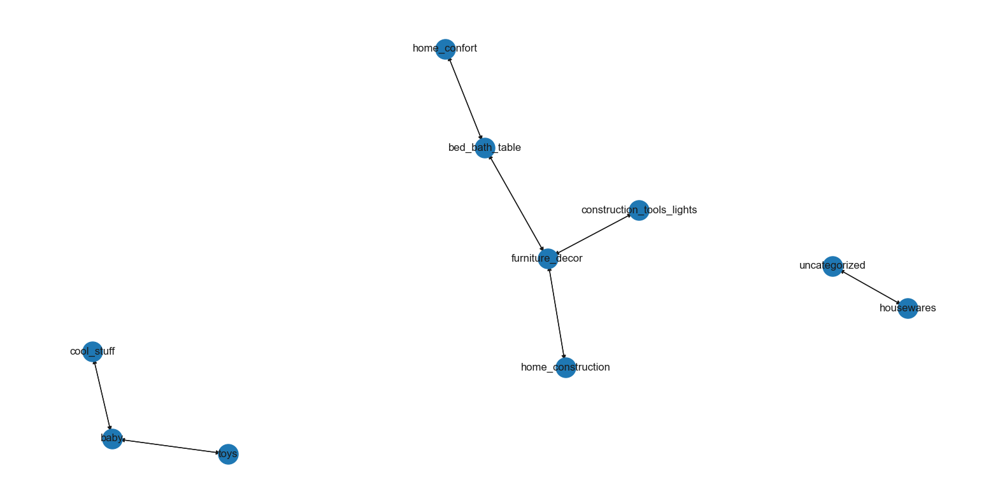

In [99]:
import networkx as nx
import matplotlib.pyplot as plt

# Create graph object
G = nx.DiGraph()

# Add edges based on association rules
for index, row in rules.iterrows():
    antecedents = row['antecedents']
    consequents = row['consequents']
    support = row['support']
    confidence = row['confidence']
    lift = row['lift']
    for antecedent in antecedents:
        for consequent in consequents:
            G.add_edge(antecedent, consequent, support=support, confidence=confidence, lift=lift)

# Plot the graph
fig, ax = plt.subplots(figsize=(20, 10))
pos = nx.spring_layout(G, k=0.5)
nx.draw_networkx_nodes(G, pos, ax=ax, node_size=500)
nx.draw_networkx_edges(G, pos, ax=ax, width=1)
nx.draw_networkx_labels(G, pos, ax=ax, font_size=12, font_family='sans-serif')
ax.set_axis_off()
plt.show()

## b) Decision Tree
A decision tree is a type of supervised machine learning used to categorize or make predictions based on how a previous set of questions were answered. The model is a form of supervised learning, meaning that the model is trained and tested on a set of data that contains the desired categorization.

In [100]:
# Import required libraries
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Prepare the data
X = cleaned_data[['customer_state', 'customer_zip_code_prefix', 'price', 'freight_value', 'delivery_days', 'review_score', 'seller_state']]
y = cleaned_data['product_category_name']
X = pd.get_dummies(X, columns=['customer_state', 'seller_state'])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the decision tree model
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.475298822887788


After training a decision tree model on our dataset, we can use the model to make predictions on new data points. In the context of customer behavior and preferences, we can use the model to predict the likelihood of a customer taking a certain action based on their past behavior and purchase history.

For example, if we have a new customer with a certain purchase history, we can use the decision tree model to predict the likelihood of that customer making a certain purchase or taking a certain action. We can also use the model to identify which variables or factors are most important in driving customer behavior, which can inform our marketing and sales strategies.

Overall, the decision tree model can provide valuable insights into customer behavior and preferences, and can be used to make predictions and inform business decisions.

### Testing 3 different test cases using the Decision Tree
### Example 1: 
This array represents a customer from the state of São Paulo (SP) with a zip code prefix of 10000, who purchased an electronics product for a price of 50.0.

In [101]:
# Create a new DataFrame with the input features
new_data_df = pd.DataFrame({
    'customer_state': ['SP'],
    'customer_zip_code_prefix': [10000],
    'price': [50.0],
    'product_category_name': ['electronics']
})

# Perform one-hot encoding on the new data
new_data_df = pd.get_dummies(new_data_df, columns=['customer_state', 'product_category_name'])

# Reorder columns to match the model's expected input
new_data = new_data_df.reindex(columns=X.columns, fill_value=0)

# Make a prediction using the decision tree classifier
prediction = clf.predict(new_data)

# Print the predicted behavior
print(prediction)


['stationery']


### Example 2: 
This array represents a customer from the state of Rio de Janeiro (RJ) with a zip code prefix of 20000, who purchased a home appliance product for a price of 80.0.

In [102]:
new_data_df2 = pd.DataFrame({
    'customer_state': ['RJ'],
    'customer_zip_code_prefix': [20000],
    'price': [80.0],
    'product_category_name': ['home appliances']
})

# Perform one-hot encoding on the new data
new_data_df2 = pd.get_dummies(new_data_df2, columns=['customer_state', 'product_category_name'])

# Reorder columns to match the model's expected input
new_data = new_data_df2.reindex(columns=X.columns, fill_value=0)

# Make a prediction using the decision tree classifier
prediction = clf.predict(new_data)

# Print the predicted behavior
print(prediction)

['health_beauty']


### Example 3: 
This array represents a customer from the state of São Paulo (SP) with a zip code prefix of 15000, who purchased a health and beauty product for a price of 20.0.

In [103]:
new_data_df3 = pd.DataFrame({
    'customer_state': ['SP'],
    'customer_zip_code_prefix': [15000],
    'price': [20.0],
    'product_category_name': ['health and beauty']
})

# Perform one-hot encoding on the new data
new_data_df3 = pd.get_dummies(new_data_df3, columns=['customer_state', 'product_category_name'])

# Reorder columns to match the model's expected input
new_data = new_data_df3.reindex(columns=X.columns, fill_value=0)

# Make a prediction using the decision tree classifier
prediction = clf.predict(new_data)

# Print the predicted behavior
print(prediction)

['bed_bath_table']


### Try it yourself! 
Enter the demographics of a customer you have in mind to see their next possible purchase using the Decision Tree 

In [104]:
# Ask user for customer attributes
customer_state = input("Enter customer state: ")
customer_zip_code_prefix = int(input("Enter customer zip code prefix: "))
price = float(input("Enter product price: "))
product_category_name = input("Enter product category name: ")

# Create a new DataFrame with the input features
new_data_df = pd.DataFrame({
    'customer_state': [customer_state],
    'customer_zip_code_prefix': [customer_zip_code_prefix],
    'price': [price],
    'product_category_name': [product_category_name]
})

# Perform one-hot encoding on the new data
new_data_df = pd.get_dummies(new_data_df, columns=['customer_state', 'product_category_name'])

# Reorder columns to match the model's expected input
new_data = new_data_df.reindex(columns=X.columns, fill_value=0)

# Make a prediction using the decision tree classifier
prediction = clf.predict(new_data)

# Print the predicted behavior
print(prediction)


Enter customer state: RJ
Enter customer zip code prefix: 20000
Enter product price: 35.0
Enter product category name: stationery
['sports_leisure']


## c) Linear Regression for Delivery Time and Review Scores
To predict customer behavior and preferences based on review scores and delivery time, we can use a supervised machine learning technique, Linear Regression. 

In [105]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Select the relevant columns
data = cleaned_data[['customer_unique_id', 'customer_state', 'customer_zip_code_prefix', 'order_id', 'order_item_id', 'price', 'freight_value', 'order_purchase_timestamp', 'order_estimated_delivery_date', 'order_delivered_customer_date', 'delivery_days', 'delay', 'product_id', 'review_id', 'review_score', 'seller_id', 'seller_state']]

# Prepare the data
X = data[['delivery_days', 'review_score']]
y = data['delay']
X = X.dropna()
y = y[X.index]

# Split the data into training and testing sets
split = int(len(X) * 0.8)
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
r2 = r2_score(y_test, y_pred)
print('R2 score:', r2)


R2 score: 0.34342029791113604


An R2 score of 0.3434 indicates that the model can explain only 34.34% of the variance in the target variable (review_score). This means that there is still a lot of unexplained variance in the data. In terms of the problem statement, this suggests that the model may not be accurately capturing all the factors that influence customer behaviour and purchase patterns on the Brazilian E-commerce website. With this result, we felt that further analysis was necessary to provide more reliable insights to improve the sales and marketing strategy. 

### What can be done with the above data?
We could analyze the product categories that are popular among customers who give high review scores and have short delivery times, and focus on promoting those categories.

Over the next few kernels, we will do the following:
1) Filter the dataset to only include orders with high review scores and short delivery times. We can define "high review scores" as those greater than a certain threshold, such as 4 or 5 out of 5. We can define "short delivery times" as those that are below the average or median delivery time.

2) Group the filtered dataset by product category and calculate the total number of orders and total revenue for each category.

3) Sort the product categories in descending order based on the total number of orders.

4) Visualize the data in a bar chart to see the most popular product categories among customers who give high review scores and have short delivery times.

In [106]:
# Define the threshold for high review scores
threshold = 4

# Calculate the average delivery time
avg_delivery_time = cleaned_data['delivery_days'].mean()
print(avg_delivery_time)

# Filter the dataset to only include orders with high review scores and short delivery times
filtered_data = cleaned_data[(cleaned_data['review_score'] >= threshold) & (cleaned_data['delivery_days'] < avg_delivery_time)]

# Group the filtered dataset by product category and calculate the total number of orders and total revenue for each category
category_data = filtered_data.groupby('product_category_name').agg({'order_id': 'count', 'price': 'sum'})
category_data = category_data.rename(columns={'order_id': 'total_orders', 'price': 'total_revenue'})

# Sort the product categories in descending order based on the total number of orders
category_data = category_data.sort_values('total_orders', ascending=False)

category_data

11.970412318656146


,total_orders,total_revenue
product_category_name,,
health_beauty,5119,605740.62
bed_bath_table,5002,470755.82
sports_leisure,4370,465243.13
housewares,3759,322008.03
furniture_decor,3671,305607.66
...,...,...
cds_dvds_musicals,9,485.00
fashion_childrens_clothes,6,429.96
portable kitchen and food preparers,5,1641.31


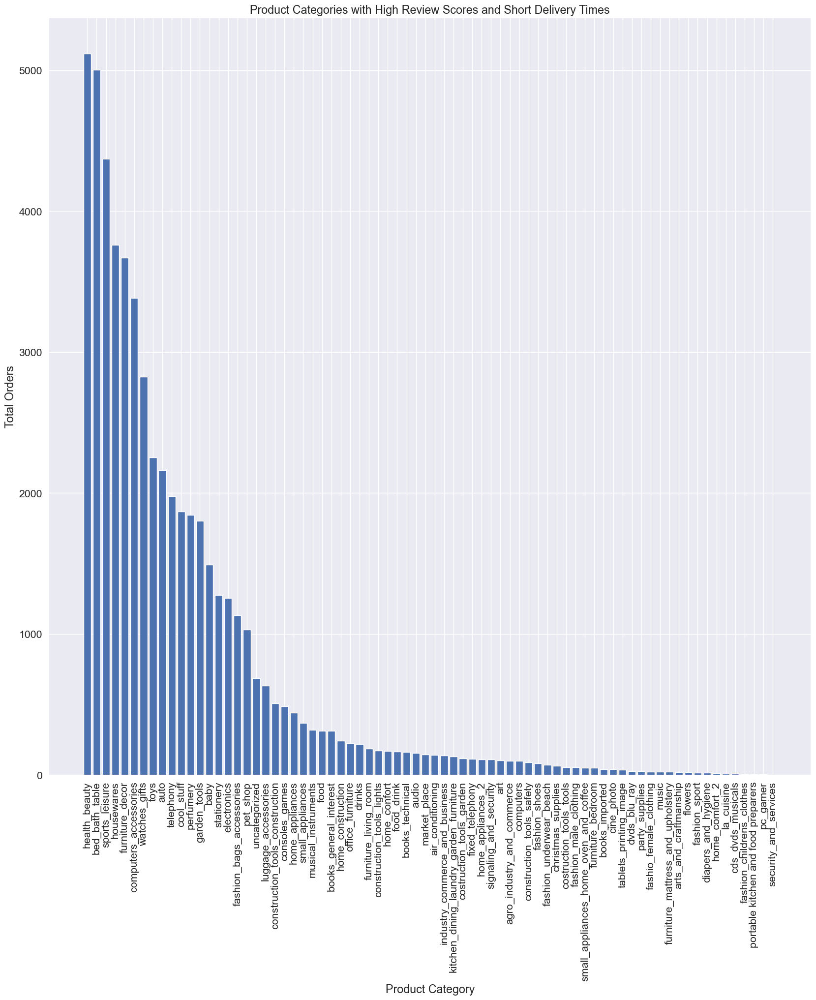

In [107]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20,20))

# Visualize the data in a bar chart
plt.bar(category_data.index, category_data['total_orders'])
plt.xticks(rotation=90)
plt.xlabel('Product Category')
plt.ylabel('Total Orders')
plt.title('Product Categories with High Review Scores and Short Delivery Times')
plt.show()

## d) Multi-Variate Linear Regression
The purpose of using multivariate linear regression for this problem statement is to understand how different variables affect customer behavior and purchase patterns. By analyzing the relationship between the predictor variables and the response variable, we can gain insights into what factors are driving sales on the Brazilian e-commerce website.

We will be using the Top 3 Product Categories for the Multi-Variate Linear Regression: bed_bath_table, health_beauty, sports_leisure
## (i) bed_bath_table

In [108]:
bed_table_bath = cleaned_data.groupby(['product_category_name']).get_group('bed_bath_table')
bed_table_bath

,customer_unique_id,customer_state,customer_zip_code_prefix,order_id,order_item_id,price,freight_value,order_purchase_timestamp,order_estimated_delivery_date,order_delivered_customer_date,delivery_days,delay,product_id,product_category_name,review_id,review_score,seller_id,seller_state
13,e2dfa3127fedbbca9707b36304996dab,SP,4812,5ff96c15d0b717ac6ad1f3d77225a350,1,19.90,12.80,2018-07-25 17:44:10,2018-08-08,2018-07-30 15:52:25,4,-9,10adb53d8faa890ca7c2f0cbcb68d777,bed_bath_table,346e42116863ea64d51cef464d8f0c9c,5,1900267e848ceeba8fa32d80c1a5f5a8,SP
18,d0ff1a7468fcc46b8fc658ab35d2a12c,SP,13186,85ce859fd6dc634de8d2f1e290444043,1,17.90,11.85,2017-11-21 00:03:41,2017-12-11,2017-11-27 18:28:00,6,-14,cce679660c66e6fbd5c8091dfd29e9cd,bed_bath_table,70c498f6918af37d6444d7846449ea5b,5,d2374cbcbb3ca4ab1086534108cc3ab7,SP
40,1b542f810484d8c042aed33a7c61a218,SP,4561,7206b86ea789983f7a273ea7fa0bc2a8,1,36.90,12.79,2018-03-26 17:12:18,2018-04-12,2018-04-05 22:11:18,10,-7,9a469eaf45dfbc43d39ba1977a3c07af,bed_bath_table,5b1625e5b9843840ed3ab3f164eb5e3f,3,d2374cbcbb3ca4ab1086534108cc3ab7,SP
62,6da92ae920ab16fc4eceb8fcd7bd43ce,SP,8280,68873cf91053cd11e6b49a766db5af1a,1,79.90,11.76,2017-11-30 22:02:15,2017-12-18,2017-12-05 20:28:40,4,-13,15a9e834e89eab39d973492882c658d6,bed_bath_table,49dc1a77d03e598dbe358fbdd36d602c,4,a673821011d0cec28146ea42f5ab767f,SP
95,04e495a3f45df8b41be2e934bbc16961,RS,94055,10c320f977c6a18f91b2d14be13128c6,1,110.99,21.27,2017-05-09 20:48:59,2017-06-01,2017-05-18 13:22:35,8,-14,b3be1f83cef05668c25e134852d44545,bed_bath_table,405af8af63b8abbef3d7296ec77c54cd,3,3b15288545f8928d3e65a8f949a28291,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110771,9108b540419f20edc605468f3966813b,SP,15093,a6bd1f93b7ff72cc348ca07f38ec4bee,1,59.90,17.33,2018-04-20 17:28:40,2018-05-15,2018-04-28 17:38:42,8,-17,c045b19fdb30a3035c56d04c6fe2e622,bed_bath_table,eb4c94cf604d9cf4d4442890ac33797d,5,259f7b5e6e482c230e5bfaa670b6bb8f,SP
110796,f2ab8c03cf28a5407c6181a9042d8ada,SP,4520,a3480694574e74545579bf7d974318d0,1,22.90,11.85,2018-02-14 17:54:39,2018-03-06,2018-02-26 18:27:19,12,-8,1a428b685ede76217c9efb550c4aaa59,bed_bath_table,ac6dad758881f168065fa66707e5475b,5,d2374cbcbb3ca4ab1086534108cc3ab7,SP
110798,6a39c9d64f67605f393a88182603a9c7,SP,11320,41d74f5b8f1fb05bdec674cbba8f720f,1,39.00,11.85,2018-02-04 14:35:02,2018-03-01,2018-02-15 19:35:37,11,-14,6fdbc2d597f906254d258d8d64d71925,bed_bath_table,7db8262f94491ed7d94f1301b2e91a90,1,f7ccf836d21b2fb1de37564105216cc1,SP
110817,bd7df6ff9e4a04991eea842883f79e9a,RS,90200,6f46d42016226f77893ed3978d6903d0,1,27.90,15.10,2017-07-05 15:55:19,2017-08-14,2017-07-19 22:10:03,14,-26,9cbe4a1fd4db99c14512e9b2ff033ec4,bed_bath_table,a2d18b7c1997735ca5196ea804192574,5,d2374cbcbb3ca4ab1086534108cc3ab7,SP


In [109]:
# Import train_test_split from sklearn
from sklearn.model_selection import train_test_split
import seaborn as sb

sales = pd.DataFrame(bed_table_bath['price'])  # Response
freight = pd.DataFrame(bed_table_bath['freight_value'])  # Predictor

# Split the Dataset into Train and Test
freight_train, freight_test, sales_train, sales_test = train_test_split(freight, sales, test_size = 0.25)

# Check the sample sizes
print("Train Set :", sales_train.shape, freight_train.shape)
print("Test Set  :", sales_test.shape, freight_test.shape)

Train Set : (8238, 1) (8238, 1)
Test Set  : (2747, 1) (2747, 1)


<AxesSubplot:>

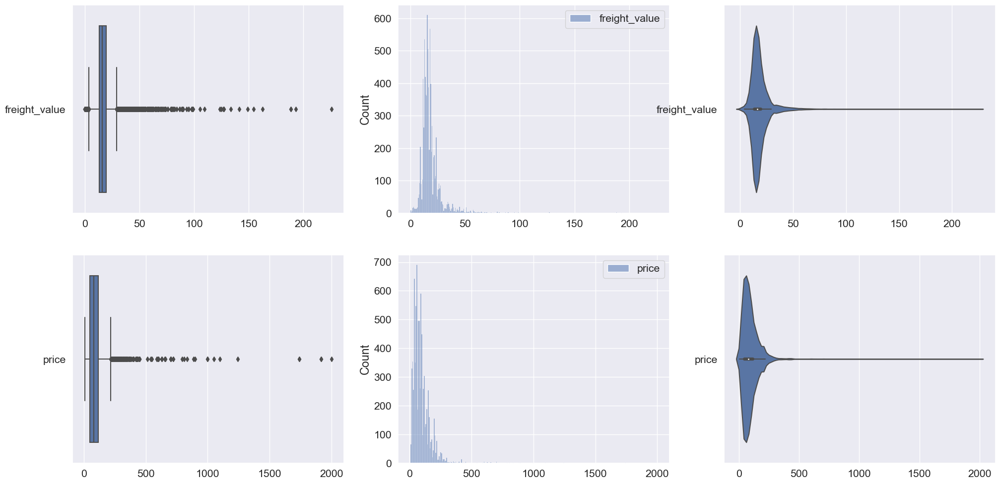

In [110]:
# Set up matplotlib figure with three subplots
f, axes = plt.subplots(2, 3, figsize=(24, 12))

# Plot the basic uni-variate figures for freight Train
sb.boxplot(data = freight_train, orient = "h", ax = axes[0,0])
sb.histplot(data = freight_train, ax = axes[0,1])
sb.violinplot(data = freight_train, orient = "h", ax = axes[0,2])

# Plot the basic uni-variate figures for sales Train
sb.boxplot(data = sales_train, orient = "h", ax = axes[1,0])
sb.histplot(data = sales_train, ax = axes[1,1])
sb.violinplot(data = sales_train, orient = "h", ax = axes[1,2])

### Train the Linear Regression model linreg using the Train Set

In [111]:
# Create a Linear Regression object
linreg = LinearRegression()

# Train the Linear Regression model
linreg.fit(freight_train, sales_train)

# Coefficients of the Linear Regression line
print('Intercept \t: b = ', linreg.intercept_)
print('Coefficients \t: a = ', linreg.coef_)

Intercept 	: b =  [25.53871724]
Coefficients 	: a =  [[3.71316879]]


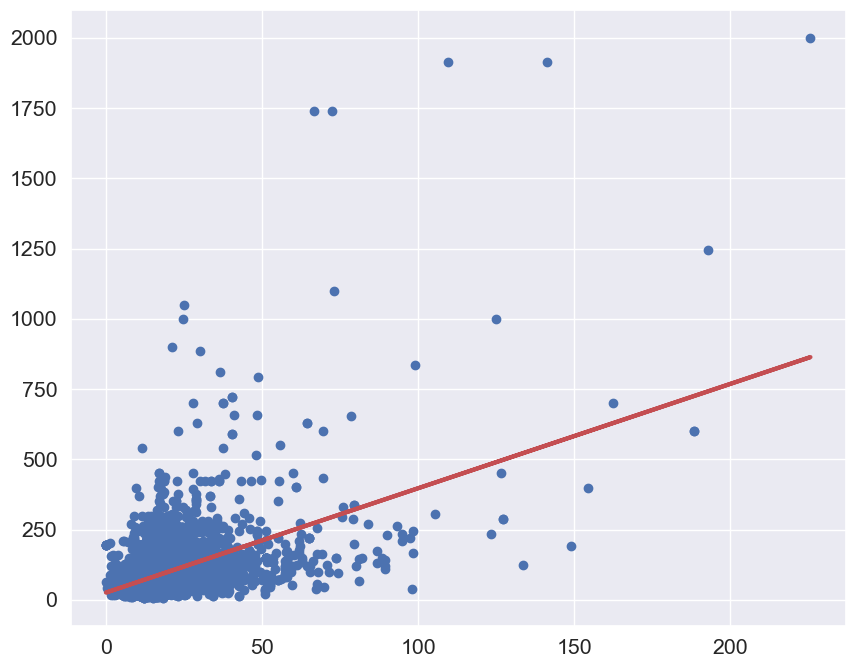

In [112]:
# Formula for the Regression line
regline_x = freight_train
regline_y = linreg.intercept_ + linreg.coef_ * freight_train

# Plot the Linear Regression line
f = plt.figure(figsize=(10, 8))
plt.scatter(freight_train, sales_train)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

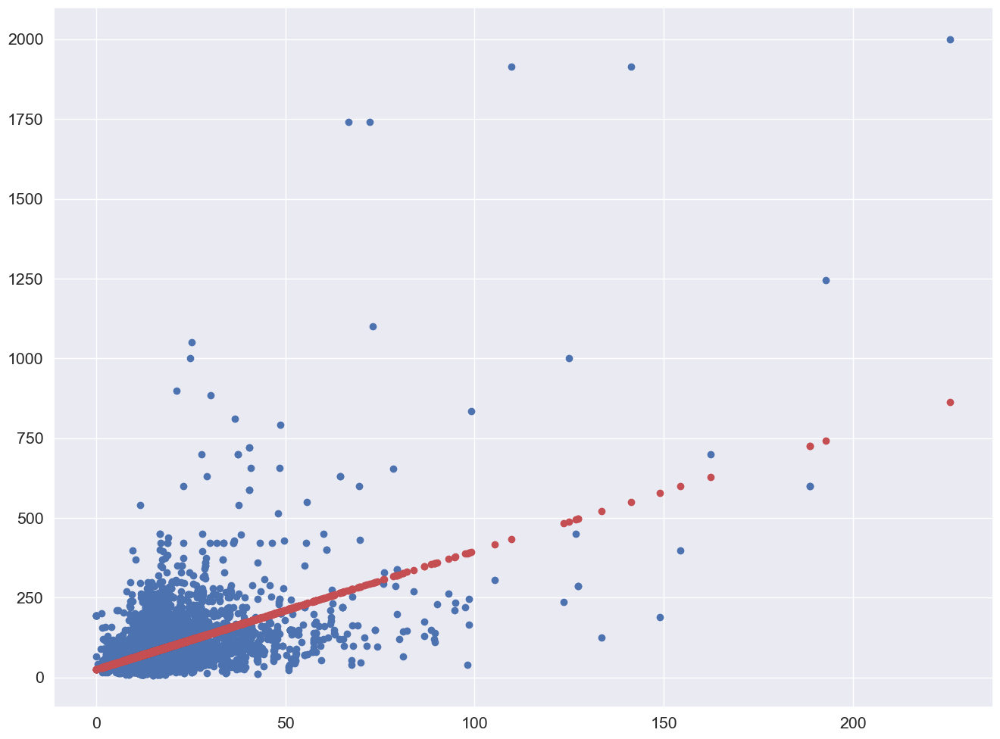

In [113]:
# Predict Sales values corresponding to freight Train
sales_train_pred = linreg.predict(freight_train)

# Plot the Linear Regression line
f = plt.figure(figsize=(16, 12))
plt.scatter(freight_train, sales_train)
plt.scatter(freight_train, sales_train_pred, color = "r")
plt.show()

### Goodness of Fit of the Model

In [114]:
# Explained Variance (R^2)
print("Explained Variance (R^2) \t:", linreg.score(freight_train, sales_train))

# Mean Squared Error (MSE)
def mean_sq_err(actual, predicted):
    '''Returns the Mean Squared Error of actual and predicted values'''
    return np.mean(np.square(np.array(actual) - np.array(predicted)))


mse = mean_sq_err(sales_train, sales_train_pred)
print("Mean Squared Error (MSE) \t:", mse)
print("Root Mean Squared Error (RMSE) \t:", np.sqrt(mse))

Explained Variance (R^2) 	: 0.22681014935314658
Mean Squared Error (MSE) 	: 5652.19029123838
Root Mean Squared Error (RMSE) 	: 75.18105008071103


### Test the Linear Regression model linreg using the Test Set.

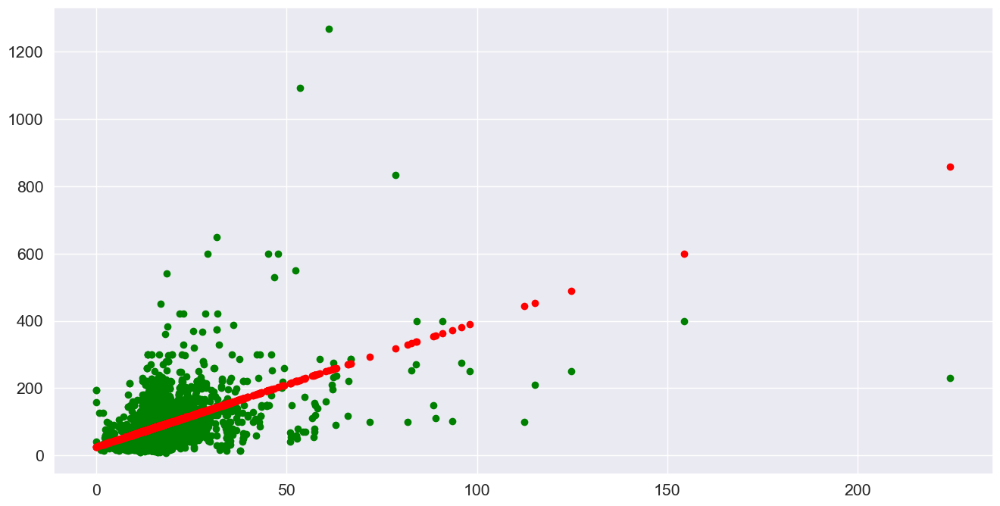

In [115]:
# Predict Total values corresponding to freight Tests
sales_test_pred = linreg.predict(freight_test)

# Plot the Predictions
f = plt.figure(figsize=(16, 8))
plt.scatter(freight_test, sales_test, color = "green")
plt.scatter(freight_test, sales_test_pred, color = "red")
plt.show()

### Check how good the predictions are on the Test Set

In [116]:
# Explained Variance (R^2)
print("Explained Variance (R^2) \t:", linreg.score(freight_test, sales_test))

# Mean Squared Error (MSE)
def mean_sq_err(actual, predicted):
    '''Returns the Mean Squared Error of actual and predicted values'''
    return np.mean(np.square(np.array(actual) - np.array(predicted)))

mse = mean_sq_err(sales_test, sales_test_pred)
print("Mean Squared Error (MSE) \t:", mse)
print("Root Mean Squared Error (RMSE) \t:", np.sqrt(mse))

Explained Variance (R^2) 	: 0.12459119472841829
Mean Squared Error (MSE) 	: 4582.165754259266
Root Mean Squared Error (RMSE) 	: 67.69169634644463


## (ii) health_beauty

In [117]:
health_beauty = cleaned_data.groupby(['product_category_name']).get_group('health_beauty')
health_beauty

,customer_unique_id,customer_state,customer_zip_code_prefix,order_id,order_item_id,price,freight_value,order_purchase_timestamp,order_estimated_delivery_date,order_delivered_customer_date,delivery_days,delay,product_id,product_category_name,review_id,review_score,seller_id,seller_state
20,d699688533772c15a061e8ce81cb56df,SP,4001,203096f03d82e0dffbc41ebc2e2bcfb7,1,109.90,8.96,2017-09-18 14:31:30,2017-09-28,2017-10-09 22:23:46,21,11,5ac9d9e379c606e36a8094a6046f75dc,health_beauty,38cae21b1b57a95959440380d5b2ef7a,2,633ecdf879b94b5337cca303328e4a25,SP
21,68954feaafe4dd638f3bd3e2afa174ec,SP,8473,f848643eec1d69395095eb3840d2051e,1,79.99,8.91,2018-03-15 08:52:40,2018-03-29,2018-03-19 18:08:32,4,-10,2b4609f8948be18874494203496bc318,health_beauty,f3d78d82a38fc81f086b0d810edcf3aa,5,cc419e0650a3c5ba77189a1882b7556a,SP
39,5f7d7732b351ce851a158528581af05f,PE,54330,434d158e96bdd6972ad6e6d73ddcfd22,1,445.00,63.17,2018-06-01 12:23:13,2018-07-17,2018-06-18 21:32:52,17,-29,c7df652246ed7b3300aaf46960c141e4,health_beauty,b3b4ba30f4ff674b60b53cbb408ad037,5,a5cba26a62b8b4d0145b68b841e62e7f,PR
80,32de2a7a93dbfc527b3f584744b9c6ce,MG,37310,974c1993ab8024d3ed16229183c2308d,1,69.90,14.66,2017-02-20 11:45:39,2017-03-21,2017-03-09 14:27:58,17,-12,5e2ba75ad255ff60b1c76c5bf526ae9b,health_beauty,13e5d0c88df75ece0878b9c4e3a3cc03,5,f84a00e60c73a49e7e851c9bdca3a5bb,RJ
92,bb4d84a2b45b22ed710ac8c0dec63d1a,SP,8552,b8801cccd8068de30112e4f49903d74a,1,19.99,7.78,2017-07-30 03:06:35,2017-08-16,2017-08-01 14:27:31,2,-15,154e7e31ebfa092203795c972e5804a6,health_beauty,2aff17b27e1fa4125d6d9e9800b22d07,3,cc419e0650a3c5ba77189a1882b7556a,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110809,0cc2c169569fd06473481e06325a5321,MG,31744,3cea94817a51f34aa5937784fb4a3219,1,439.65,20.96,2018-04-01 16:13:26,2018-04-19,2018-04-06 21:32:35,5,-13,e3dd336775af78a83fc27ed85f0f15da,health_beauty,69dff673a503deb37ad1ea5cf46abaaa,4,edb1ef5e36e0c8cd84eb3c9b003e486d,RJ
110815,39fff7cb5873a7116b02234bd1e6c6dc,SP,11320,1b4a0e6b19d0034b531655b41ea89623,1,37.90,11.85,2017-10-02 08:45:35,2017-10-24,2017-10-06 16:58:25,4,-18,9e10ae46a3021a02f1692448ef9fa1db,health_beauty,47697b20bcd3995f870e284fad248ac8,4,8b28d096634035667e8263d57ba3368c,SP
110831,e03dbdf5e56c96b106d8115ac336f47f,MG,35502,aa04ef5214580b06b10e2a378300db44,1,370.00,19.43,2017-01-27 00:30:03,2017-03-17,2017-02-07 13:15:25,11,-38,9fc063fd34fed29ccc57b7f8e8d03388,health_beauty,e8995c053d3db2d9c07407efe7de52dd,5,ccc4bbb5f32a6ab2b7066a4130f114e3,PR
110833,6359f309b166b0196dbf7ad2ac62bb5a,SP,12209,9c5dedf39a927c1b2549525ed64a053c,1,72.00,13.08,2017-03-09 09:54:05,2017-03-28,2017-03-17 15:08:01,8,-11,ac35486adb7b02598c182c2ff2e05254,health_beauty,e262b3f92d1ce917aa412a9406cf61a6,5,e24fc9fcd865784fb25705606fe3dfe7,SP


In [118]:
sales = pd.DataFrame(health_beauty['price'])  # Response
freight = pd.DataFrame(health_beauty['freight_value'])  # Predictor

# Import train_test_split from sklearn
from sklearn.model_selection import train_test_split

# Split the Dataset into Train and Test
freight_train, freight_test, sales_train, sales_test = train_test_split(freight, sales, test_size = 0.25)

# Check the sample sizes
print("Train Set :", sales_train.shape, freight_train.shape)
print("Test Set  :", sales_test.shape, freight_test.shape)

Train Set : (7093, 1) (7093, 1)
Test Set  : (2365, 1) (2365, 1)


<AxesSubplot:>

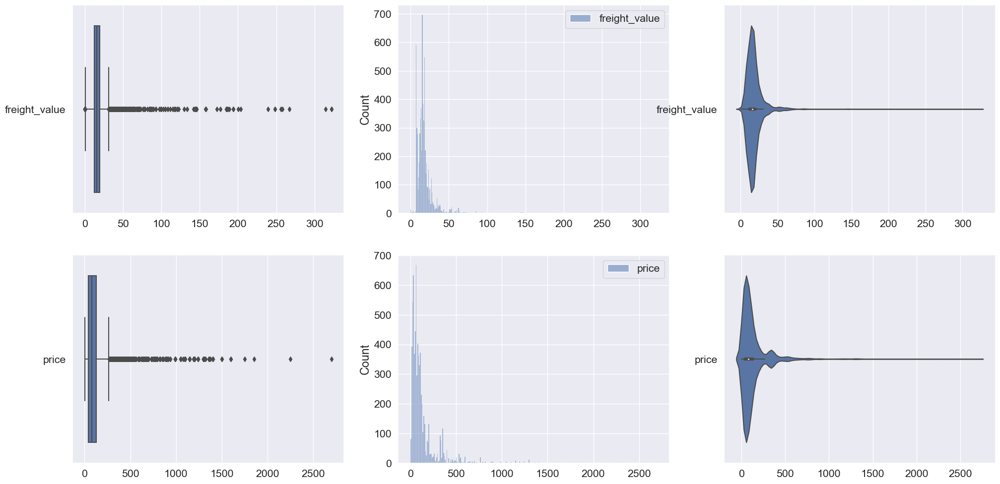

In [119]:
# Set up matplotlib figure with three subplots
f, axes = plt.subplots(2, 3, figsize=(24, 12))

# Plot the basic uni-variate figures for freight Train
sb.boxplot(data = freight_train, orient = "h", ax = axes[0,0])
sb.histplot(data = freight_train, ax = axes[0,1])
sb.violinplot(data = freight_train, orient = "h", ax = axes[0,2])

# Plot the basic uni-variate figures for sales Train
sb.boxplot(data = sales_train, orient = "h", ax = axes[1,0])
sb.histplot(data = sales_train, ax = axes[1,1])
sb.violinplot(data = sales_train, orient = "h", ax = axes[1,2])

### Train the Linear Regression model linreg using the Train Set.

In [120]:
# Import LinearRegression model from Scikit-Learn
from sklearn.linear_model import LinearRegression

# Create a Linear Regression object
linreg = LinearRegression()

# Train the Linear Regression model
linreg.fit(freight_train, sales_train)

# Coefficients of the Linear Regression line
print('Intercept \t: b = ', linreg.intercept_)
print('Coefficients \t: a = ', linreg.coef_)

Intercept 	: b =  [47.86185321]
Coefficients 	: a =  [[4.34148216]]


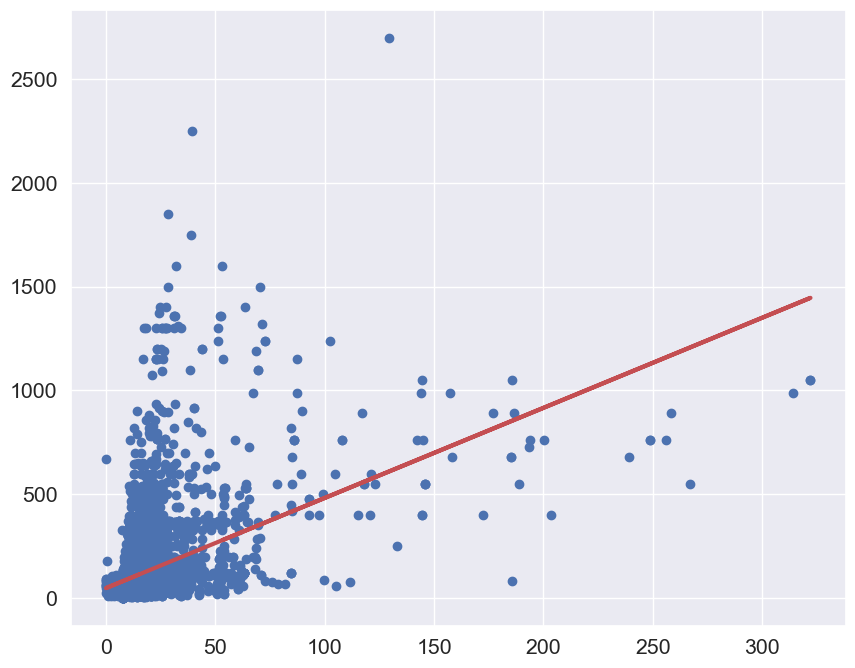

In [121]:
# Formula for the Regression line
regline_x = freight_train
regline_y = linreg.intercept_ + linreg.coef_ * freight_train

# Plot the Linear Regression line
f = plt.figure(figsize=(10, 8))
plt.scatter(freight_train, sales_train)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

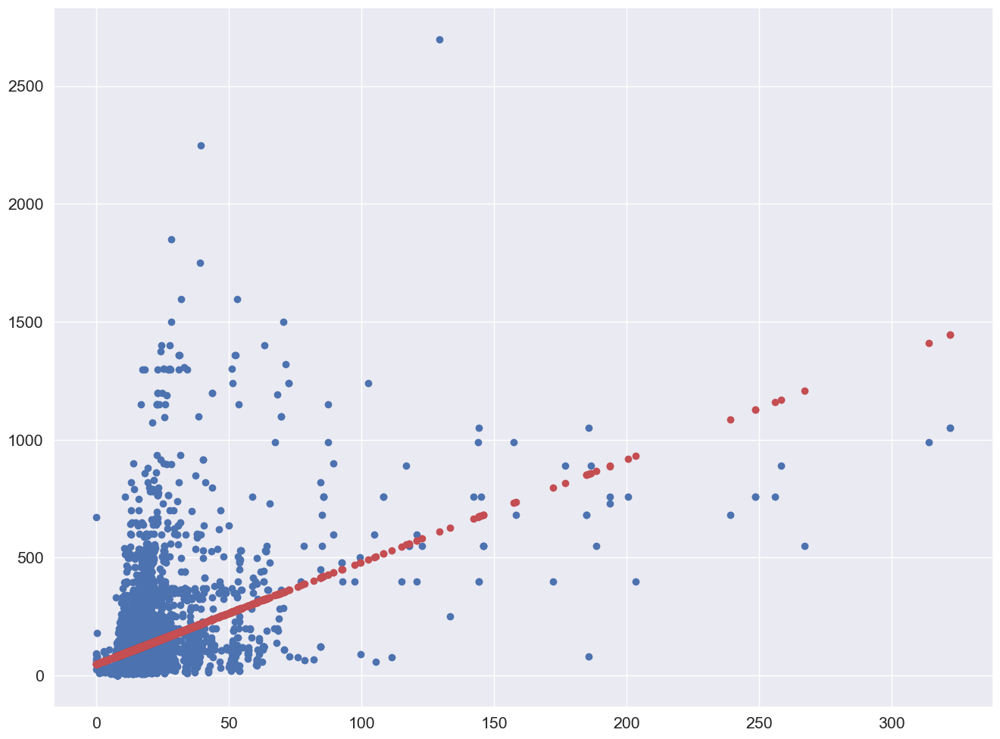

In [122]:
# Predict Sales values corresponding to freight Train
sales_train_pred = linreg.predict(freight_train)

# Plot the Linear Regression line
f = plt.figure(figsize=(16, 12))
plt.scatter(freight_train, sales_train)
plt.scatter(freight_train, sales_train_pred, color = "r")
plt.show()

### Goodness of Fit of the Model
Check how good the predictions are on the Train Set.
Metrics : Explained Variance and Mean Squared Error.

In [123]:
# Explained Variance (R^2)
print("Explained Variance (R^2) \t:", linreg.score(freight_train, sales_train))

# Mean Squared Error (MSE)
def mean_sq_err(actual, predicted):
    '''Returns the Mean Squared Error of actual and predicted values'''
    return np.mean(np.square(np.array(actual) - np.array(predicted)))


mse = mean_sq_err(sales_train, sales_train_pred)
print("Mean Squared Error (MSE) \t:", mse)
print("Root Mean Squared Error (RMSE) \t:", np.sqrt(mse))

Explained Variance (R^2) 	: 0.1797986823156572
Mean Squared Error (MSE) 	: 24659.65468806878
Root Mean Squared Error (RMSE) 	: 157.033928461555


### Test the Linear Regression model linreg using the Test Set.

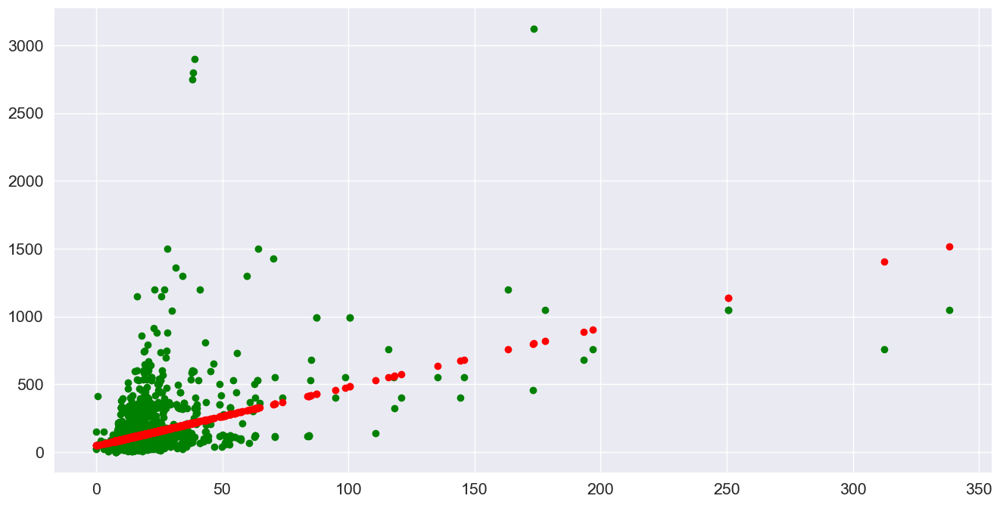

In [124]:
# Predict Total values corresponding to freight Tests
sales_test_pred = linreg.predict(freight_test)

# Plot the Predictions
f = plt.figure(figsize=(16, 8))
plt.scatter(freight_test, sales_test, color = "green")
plt.scatter(freight_test, sales_test_pred, color = "red")
plt.show()

### Check how good the predictions are on the Test Set.

In [125]:
# Explained Variance (R^2)
print("Explained Variance (R^2) \t:", linreg.score(freight_test, sales_test))

# Mean Squared Error (MSE)
def mean_sq_err(actual, predicted):
    '''Returns the Mean Squared Error of actual and predicted values'''
    return np.mean(np.square(np.array(actual) - np.array(predicted)))

mse = mean_sq_err(sales_test, sales_test_pred)
print("Mean Squared Error (MSE) \t:", mse)
print("Root Mean Squared Error (RMSE) \t:", np.sqrt(mse))

Explained Variance (R^2) 	: 0.2089141066948289
Mean Squared Error (MSE) 	: 30712.959063383805
Root Mean Squared Error (RMSE) 	: 175.25113141827018


## (iii) sport_leisure

In [126]:
sport_leisure = cleaned_data.groupby(['product_category_name']).get_group('sports_leisure')
sport_leisure

,customer_unique_id,customer_state,customer_zip_code_prefix,order_id,order_item_id,price,freight_value,order_purchase_timestamp,order_estimated_delivery_date,order_delivered_customer_date,delivery_days,delay,product_id,product_category_name,review_id,review_score,seller_id,seller_state
43,4ca5f90433afb5493247f0bafb583483,DF,73350,948097deef559c742e7ce321e5e58919,1,69.90,25.77,2017-08-04 17:10:39,2017-09-01,2017-08-12 14:08:40,7,-20,cd935d283d47f1050c505e1c39c48b67,sports_leisure,eba492bfeacda5b918f67f0900030dff,5,a3a38f4affed601eb87a97788c949667,SC
46,c2551ea089b7ebbc67a2ea8757152514,BA,44380,d17dc4a904426827ca80f2ccb3a6be56,1,36.90,17.92,2017-05-14 20:28:25,2017-06-12,2017-05-25 09:14:31,10,-18,ba4bfbf74dbe7ab37e263b9326da0523,sports_leisure,bcab37e37778893d858b3d159849a56d,4,f8db351d8c4c4c22c6835c19a46f01b0,SP
48,cc1a30280651daf2d918ed7868575771,RS,95270,5820a1100976432c7968a52da59e9364,1,33.90,18.34,2018-07-29 11:24:17,2018-08-13,2018-08-02 22:09:11,4,-11,1deda1acffb44ed38494667d7e49a9f3,sports_leisure,7fe86452ea24bb5085343b5e9d684a3e,5,f52c2422904463fdd7741f99045fecb6,SP
52,c77154776ead8e798c2d684205938f71,RS,90620,9faeb9b2746b9d7526aef5acb08e2aa0,1,60.00,15.52,2018-07-26 14:39:59,2018-08-16,2018-07-31 22:26:55,5,-16,f48eb5c2fde13ca63664f0bb05f55346,sports_leisure,25b502beeef8b3aff87449ccdc001f53,1,f7ba60f8c3f99e7ee4042fdef03b70c4,SP
53,c77154776ead8e798c2d684205938f71,RS,90620,9faeb9b2746b9d7526aef5acb08e2aa0,2,60.00,15.52,2018-07-26 14:39:59,2018-08-16,2018-07-31 22:26:55,5,-16,f48eb5c2fde13ca63664f0bb05f55346,sports_leisure,25b502beeef8b3aff87449ccdc001f53,1,f7ba60f8c3f99e7ee4042fdef03b70c4,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110806,6ca7990c03b703e57401911433372d1e,RS,99560,71c4b7b8844a031b7db8ca41c41d4aae,1,34.49,15.10,2017-09-03 20:52:34,2017-10-03,2017-09-14 15:49:47,10,-19,bd5556852920e0d5ebb6044894391ca6,sports_leisure,7bb4ee5964c58afcb9dd6d43591c421a,5,e9779976487b77c6d4ac45f75ec7afe9,SP
110810,fb9310710003399b031add3e55f34719,SP,3318,e8fd20068b9f7e6ec07068bb7537f781,1,356.00,18.12,2017-08-10 21:21:07,2017-08-31,2017-08-23 15:36:29,12,-8,0df37da38a30a713453b03053d60d3f7,sports_leisure,f5453b3d33358ed459eb4312392b96a8,4,218d46b86c1881d022bce9c68a7d4b15,SP
110811,fb9310710003399b031add3e55f34719,SP,3318,e8fd20068b9f7e6ec07068bb7537f781,2,356.00,18.12,2017-08-10 21:21:07,2017-08-31,2017-08-23 15:36:29,12,-8,0df37da38a30a713453b03053d60d3f7,sports_leisure,f5453b3d33358ed459eb4312392b96a8,4,218d46b86c1881d022bce9c68a7d4b15,SP
110813,312823a3a38d7ad3046d8ba7122f93a8,DF,70648,e6cc57f923c4dab2222b8c9aa8742eea,1,113.00,15.54,2018-02-07 12:09:45,2018-05-11,2018-03-05 18:56:39,26,-67,7b35ccd93a2184646c03b70326626923,sports_leisure,c03690b720704c98edf718aedc425a68,5,4d6d651bd7684af3fffabd5f08d12e5a,SP


In [127]:
sales = pd.DataFrame(sport_leisure['price'])  # Response
freight = pd.DataFrame(sport_leisure['freight_value'])  # Predictor

# Import train_test_split from sklearn
from sklearn.model_selection import train_test_split

# Split the Dataset into Train and Test
freight_train, freight_test, sales_train, sales_test = train_test_split(freight, sales, test_size = 0.25)

# Check the sample sizes
print("Train Set :", sales_train.shape, freight_train.shape)
print("Test Set  :", sales_test.shape, freight_test.shape)

Train Set : (6327, 1) (6327, 1)
Test Set  : (2109, 1) (2109, 1)


<AxesSubplot:>

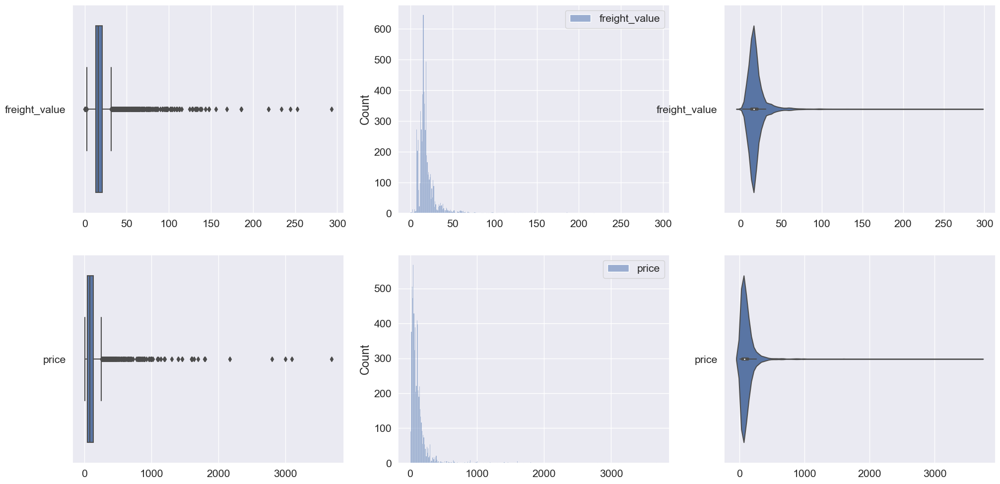

In [128]:
# Set up matplotlib figure with three subplots
f, axes = plt.subplots(2, 3, figsize=(24, 12))

# Plot the basic uni-variate figures for freight Train
sb.boxplot(data = freight_train, orient = "h", ax = axes[0,0])
sb.histplot(data = freight_train, ax = axes[0,1])
sb.violinplot(data = freight_train, orient = "h", ax = axes[0,2])

# Plot the basic uni-variate figures for sales Train
sb.boxplot(data = sales_train, orient = "h", ax = axes[1,0])
sb.histplot(data = sales_train, ax = axes[1,1])
sb.violinplot(data = sales_train, orient = "h", ax = axes[1,2])

### Train the Linear Regression model linreg using the Train Set

In [129]:
# Import LinearRegression model from Scikit-Learn
from sklearn.linear_model import LinearRegression

# Create a Linear Regression object
linreg = LinearRegression()

# Train the Linear Regression model
linreg.fit(freight_train, sales_train)

# Coefficients of the Linear Regression line
print('Intercept \t: b = ', linreg.intercept_)
print('Coefficients \t: a = ', linreg.coef_)

Intercept 	: b =  [10.39564655]
Coefficients 	: a =  [[5.30368783]]


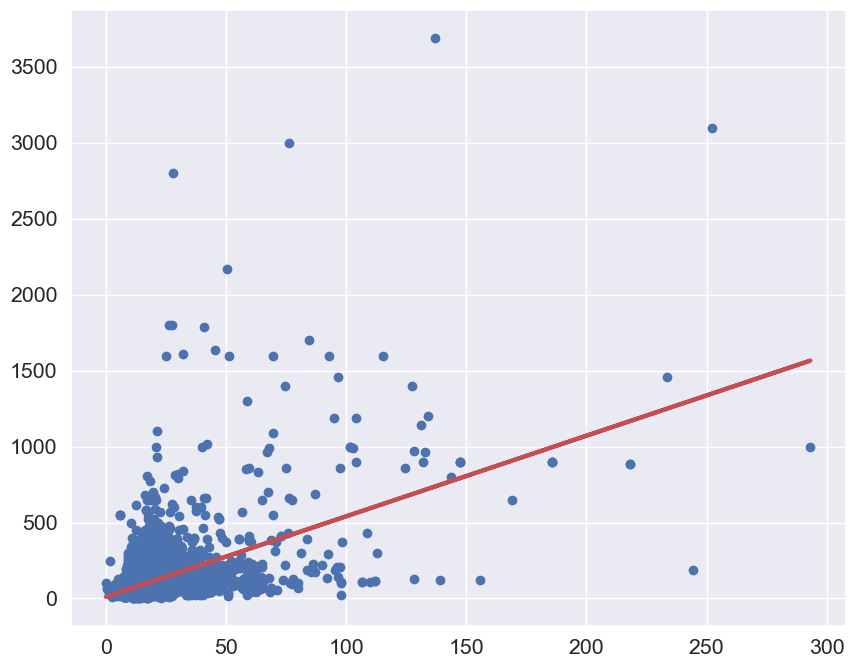

In [130]:
# Formula for the Regression line
regline_x = freight_train
regline_y = linreg.intercept_ + linreg.coef_ * freight_train

# Plot the Linear Regression line
f = plt.figure(figsize=(10, 8))
plt.scatter(freight_train, sales_train)
plt.plot(regline_x, regline_y, 'r-', linewidth = 3)
plt.show()

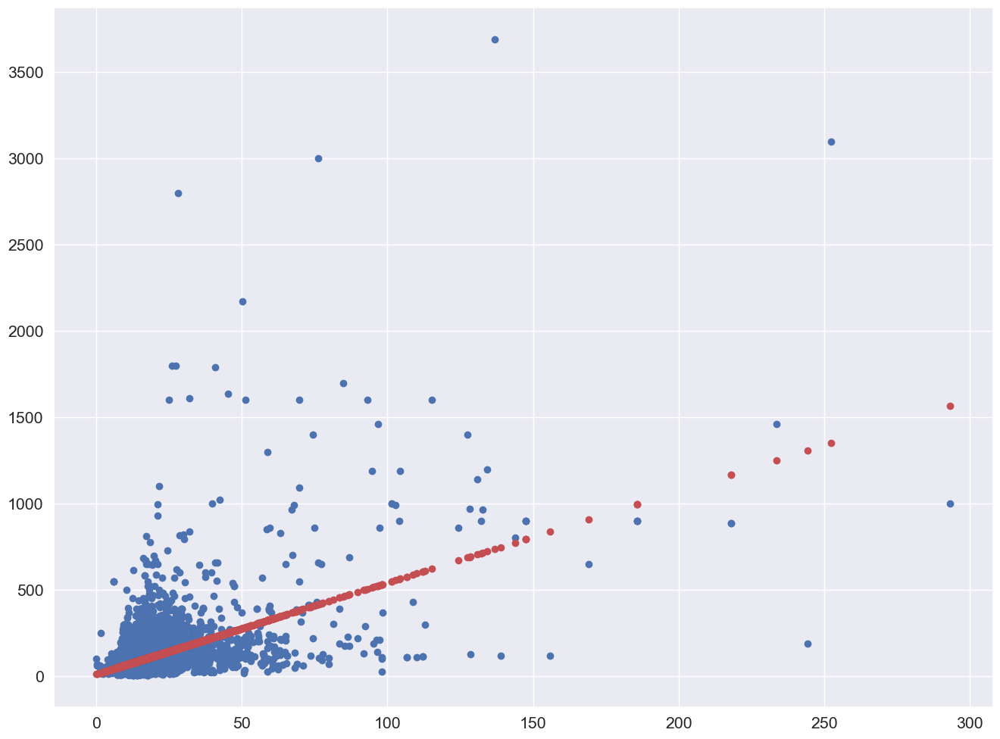

In [131]:
# Predict Sales values corresponding to freight Train
sales_train_pred = linreg.predict(freight_train)

# Plot the Linear Regression line
f = plt.figure(figsize=(16, 12))
plt.scatter(freight_train, sales_train)
plt.scatter(freight_train, sales_train_pred, color = "r")
plt.show()

### Goodness of Fit of the Model

In [132]:
# Explained Variance (R^2)
print("Explained Variance (R^2) \t:", linreg.score(freight_train, sales_train))

# Mean Squared Error (MSE)
def mean_sq_err(actual, predicted):
    '''Returns the Mean Squared Error of actual and predicted values'''
    return np.mean(np.square(np.array(actual) - np.array(predicted)))


mse = mean_sq_err(sales_train, sales_train_pred)
print("Mean Squared Error (MSE) \t:", mse)
print("Root Mean Squared Error (RMSE) \t:", np.sqrt(mse))

Explained Variance (R^2) 	: 0.26029059625760476
Mean Squared Error (MSE) 	: 17947.220403732605
Root Mean Squared Error (RMSE) 	: 133.9672363069889


### Test the Linear Regression model linreg using the Test Set.

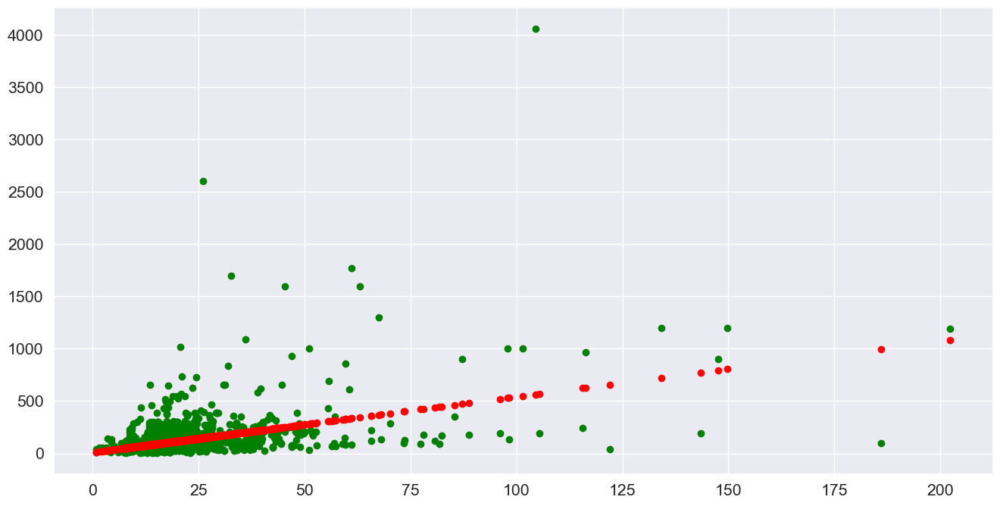

In [ ]:
# Predict Total values corresponding to freight Tests
sales_test_pred = linreg.predict(freight_test)

# Plot the Predictions
f = plt.figure(figsize=(16, 8))
plt.scatter(freight_test, sales_test, color = "green")
plt.scatter(freight_test, sales_test_pred, color = "red")
plt.show()

### Check how good the predictions are on the Test Set.

In [ ]:
# Explained Variance (R^2)
print("Explained Variance (R^2) \t:", linreg.score(freight_test, sales_test))

# Mean Squared Error (MSE)
def mean_sq_err(actual, predicted):
    '''Returns the Mean Squared Error of actual and predicted values'''
    return np.mean(np.square(np.array(actual) - np.array(predicted)))

mse = mean_sq_err(sales_test, sales_test_pred)
print("Mean Squared Error (MSE) \t:", mse)
print("Root Mean Squared Error (RMSE) \t:", np.sqrt(mse))

### What we can infer from the Linear Regressions on the 3 top selling categories:
New sellers who plan to sell products in certain categories can use linear regressions to predict their sales based on the freight value they choose. 

Unexpectedly, the regression shows a weak positive linear relationship between freight value and revenue, meaning that increasing the freight value results in higher revenue return. This is counterintuitive, as sellers usually aim to set low freight values to improve sales. For example, on major ecommerce platforms such as Taobao.com or Shopee, most products are listed with 0 shipping price in order to appear more attractive to consumers. However, it may be that customers are willing to pay a higher freight price for expensive or fragile items, or items that are bulkier and require higher shipping costs. 

New sellers should aim to collaborate with delivery companies to reduce shipping costs and offer 0 shipping prices where possible to remain competitive. Alternatively, they could calculate the shipping costs into the actual price of the product.
<hr>

# 5. Presentation of Data-Driven Insights and Recommendations:

Based on the analysis of the Brazilian E-commerce dataset, several data-driven insights and recommendations can be made to improve the performance and efficiency of the e-commerce business. 

## Some of the key insights and recommendations are:

### 1. Sales trends: 
The analysis of sales trends revealed that the highest sales occurred in the last quarter of the year, specifically in November and December. This indicates that the e-commerce business should focus on promoting their products during the holiday season to maximize sales.

### 2. Payment methods: 
The analysis of payment methods revealed that the most popular payment method was by credit card. However, the second most popular payment method was by boleto bancário, which is a payment method that allows customers to pay in cash at physical locations. This suggests that the e-commerce business should consider offering more payment options to customers, such as bank transfers or online payment systems.

### 3. Customer satisfaction: 
The analysis of customer satisfaction revealed that the average customer satisfaction score was relatively high at 4.1 out of 5. However, there were some negative reviews related to delivery times and product quality. The e-commerce business should focus on addressing these issues to improve customer satisfaction and retention.

### 4. Weekly promotions: 
Most of the orders are made during weekdays, especially on Mondays and Tuesdays. Therefore, it is recommended to offer weekday discounts or promotions to increase sales on those days.

### 5. State sales: 
The state of Sao Paulo has the highest number of orders, followed by Rio de Janeiro and Minas Gerais. Therefore, it is recommended to focus on these states for marketing campaigns and promotions.

### 6. Delivery time: 
The average delivery time is approximately 12 days, but some orders take up to 40 days to be delivered. It is recommended to improve the logistics and delivery process to reduce the delivery time and improve customer satisfaction.

### 7. Product categories:
The most popular product categories are  "bed_bath_table", "health_beauty", "sports_leisure", . It is recommended to focus on these categories and offer a wider range of products to increase sales.

### 8. Review and ratings: 
Finally, the analysis shows that customer reviews and ratings have a significant impact on sales. It is recommended to encourage customers to leave reviews and use them to improve product quality and customer satisfaction.


## Based on these insights, the following recommendations can be made:

1. Promote products heavily during the holiday season to maximize sales.

2. Offer more payment options to customers, such as bank transfers or online payment systems.

3. Focus on reducing delivery times to improve customer satisfaction.

4. Address negative reviews related to delivery times and product quality to improve customer satisfaction and retention.

5. Expand product offerings in popular categories such as  "bed_bath_table", "health_beauty", "sports_leisure",  to attract more customers.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=0797ad48-924a-4cdd-acf9-bc8d801b2572' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>